In [ ]:
!pip install pandas scikit-learn matplotlib seaborn

In [ ]:
import pandas as pd
import numpy as np

from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, classification_report

In [ ]:
import os

os.makedirs("data/raw", exist_ok=True)
os.makedirs("data/processed", exist_ok=True)
os.makedirs("models", exist_ok=True)

print("Folders created successfully")

Folders created successfully


In [ ]:
!pip install -q datasets

In [ ]:
from datasets import load_dataset

dataset = load_dataset("vadimas22/resume-score-details")

dataset

README.md:   0%|          | 0.00/4.65k [00:00<?, ?B/s]

Resolving data files:   0%|          | 0/1031 [00:00<?, ?it/s]

empty_additional_info_11.json:   0%|          | 0.00/9.48k [00:00<?, ?B/s]

empty_additional_info_0.json:   0%|          | 0.00/21.6k [00:00<?, ?B/s]

empty_additional_info_1.json:   0%|          | 0.00/6.66k [00:00<?, ?B/s]

empty_additional_info_10.json:   0%|          | 0.00/6.42k [00:00<?, ?B/s]

empty_additional_info_113.json:   0%|          | 0.00/9.29k [00:00<?, ?B/s]

empty_additional_info_111.json:   0%|          | 0.00/13.8k [00:00<?, ?B/s]

empty_additional_info_110.json:   0%|          | 0.00/13.1k [00:00<?, ?B/s]

empty_additional_info_115.json:   0%|          | 0.00/17.4k [00:00<?, ?B/s]

empty_additional_info_114.json:   0%|          | 0.00/9.09k [00:00<?, ?B/s]

empty_additional_info_116.json:   0%|          | 0.00/15.5k [00:00<?, ?B/s]

empty_additional_info_117.json:   0%|          | 0.00/10.4k [00:00<?, ?B/s]

empty_additional_info_119.json:   0%|          | 0.00/10.8k [00:00<?, ?B/s]

empty_additional_info_118.json:   0%|          | 0.00/15.3k [00:00<?, ?B/s]

empty_additional_info_120.json:   0%|          | 0.00/17.0k [00:00<?, ?B/s]

empty_additional_info_12.json:   0%|          | 0.00/12.3k [00:00<?, ?B/s]

empty_additional_info_112.json:   0%|          | 0.00/12.7k [00:00<?, ?B/s]

empty_additional_info_125.json:   0%|          | 0.00/14.5k [00:00<?, ?B/s]

empty_additional_info_123.json:   0%|          | 0.00/11.3k [00:00<?, ?B/s]

empty_additional_info_15.json:   0%|          | 0.00/19.5k [00:00<?, ?B/s]

empty_additional_info_122.json:   0%|          | 0.00/11.6k [00:00<?, ?B/s]

empty_additional_info_121.json:   0%|          | 0.00/10.3k [00:00<?, ?B/s]

empty_additional_info_13.json:   0%|          | 0.00/9.73k [00:00<?, ?B/s]

empty_additional_info_14.json:   0%|          | 0.00/10.9k [00:00<?, ?B/s]

empty_additional_info_16.json:   0%|          | 0.00/6.62k [00:00<?, ?B/s]

empty_additional_info_124.json:   0%|          | 0.00/14.8k [00:00<?, ?B/s]

empty_additional_info_22.json:   0%|          | 0.00/27.0k [00:00<?, ?B/s]

empty_additional_info_18.json:   0%|          | 0.00/15.5k [00:00<?, ?B/s]

empty_additional_info_19.json:   0%|          | 0.00/9.41k [00:00<?, ?B/s]

empty_additional_info_17.json:   0%|          | 0.00/6.46k [00:00<?, ?B/s]

empty_additional_info_20.json:   0%|          | 0.00/16.7k [00:00<?, ?B/s]

empty_additional_info_23.json:   0%|          | 0.00/9.60k [00:00<?, ?B/s]

empty_additional_info_2.json:   0%|          | 0.00/6.57k [00:00<?, ?B/s]

empty_additional_info_21.json:   0%|          | 0.00/13.6k [00:00<?, ?B/s]

empty_additional_info_7.json:   0%|          | 0.00/16.3k [00:00<?, ?B/s]

empty_additional_info_8.json:   0%|          | 0.00/15.9k [00:00<?, ?B/s]

empty_additional_info_9.json:   0%|          | 0.00/20.9k [00:00<?, ?B/s]

empty_additional_info_6.json:   0%|          | 0.00/10.1k [00:00<?, ?B/s]

empty_additional_info_3.json:   0%|          | 0.00/8.65k [00:00<?, ?B/s]

(…)_gibberish_job_description_match_20.json:   0%|          | 0.00/5.85k [00:00<?, ?B/s]

empty_additional_info_4.json:   0%|          | 0.00/10.4k [00:00<?, ?B/s]

empty_additional_info_5.json:   0%|          | 0.00/11.3k [00:00<?, ?B/s]

(…)gibberish_job_description_match_278.json:   0%|          | 0.00/2.94k [00:00<?, ?B/s]

(…)gibberish_job_description_match_289.json:   0%|          | 0.00/3.35k [00:00<?, ?B/s]

(…)gibberish_job_description_match_292.json:   0%|          | 0.00/4.33k [00:00<?, ?B/s]

(…)gibberish_job_description_match_497.json:   0%|          | 0.00/10.2k [00:00<?, ?B/s]

(…)gibberish_job_description_match_522.json:   0%|          | 0.00/6.61k [00:00<?, ?B/s]

(…)gibberish_job_description_match_398.json:   0%|          | 0.00/11.4k [00:00<?, ?B/s]

(…)gibberish_job_description_match_459.json:   0%|          | 0.00/9.13k [00:00<?, ?B/s]

(…)_gibberish_job_description_match_40.json:   0%|          | 0.00/8.39k [00:00<?, ?B/s]

(…)gibberish_job_description_match_545.json:   0%|          | 0.00/8.00k [00:00<?, ?B/s]

(…)gibberish_job_description_match_548.json:   0%|          | 0.00/23.7k [00:00<?, ?B/s]

(…)gibberish_job_description_match_567.json:   0%|          | 0.00/7.23k [00:00<?, ?B/s]

invalid_gibberish_resume_match_238.json:   0%|          | 0.00/5.41k [00:00<?, ?B/s]

(…)gibberish_job_description_match_576.json:   0%|          | 0.00/9.02k [00:00<?, ?B/s]

(…)d_gibberish_job_description_match_9.json:   0%|          | 0.00/5.15k [00:00<?, ?B/s]

(…)bberish_job_description_mismatch_18.json:   0%|          | 0.00/15.2k [00:00<?, ?B/s]

invalid_gibberish_resume_match_470.json:   0%|          | 0.00/4.14k [00:00<?, ?B/s]

invalid_gibberish_resume_match_518.json:   0%|          | 0.00/5.53k [00:00<?, ?B/s]

invalid_gibberish_resume_match_506.json:   0%|          | 0.00/5.58k [00:00<?, ?B/s]

invalid_gibberish_resume_match_525.json:   0%|          | 0.00/4.79k [00:00<?, ?B/s]

invalid_gibberish_resume_match_362.json:   0%|          | 0.00/4.21k [00:00<?, ?B/s]

invalid_gibberish_resume_match_562.json:   0%|          | 0.00/5.01k [00:00<?, ?B/s]

invalid_gibberish_resume_match_571.json:   0%|          | 0.00/4.89k [00:00<?, ?B/s]

invalid_gibberish_resume_match_311.json:   0%|          | 0.00/4.29k [00:00<?, ?B/s]

invalid_gibberish_resume_match_222.json:   0%|          | 0.00/4.08k [00:00<?, ?B/s]

invalid_gibberish_resume_match_6.json:   0%|          | 0.00/4.85k [00:00<?, ?B/s]

invalid_gibberish_resume_match_93.json:   0%|          | 0.00/5.00k [00:00<?, ?B/s]

(…)valid_gibberish_resume_mismatch_147.json:   0%|          | 0.00/5.36k [00:00<?, ?B/s]

(…)valid_gibberish_resume_mismatch_193.json:   0%|          | 0.00/5.40k [00:00<?, ?B/s]

invalid_job_description_match_107.json:   0%|          | 0.00/6.38k [00:00<?, ?B/s]

invalid_job_description_match_133.json:   0%|          | 0.00/10.9k [00:00<?, ?B/s]

invalid_job_description_match_142.json:   0%|          | 0.00/6.28k [00:00<?, ?B/s]

(…)valid_gibberish_resume_mismatch_155.json:   0%|          | 0.00/5.46k [00:00<?, ?B/s]

invalid_job_description_match_213.json:   0%|          | 0.00/6.84k [00:00<?, ?B/s]

invalid_job_description_match_144.json:   0%|          | 0.00/5.70k [00:00<?, ?B/s]

invalid_job_description_match_181.json:   0%|          | 0.00/8.74k [00:00<?, ?B/s]

invalid_job_description_match_196.json:   0%|          | 0.00/5.30k [00:00<?, ?B/s]

invalid_job_description_match_221.json:   0%|          | 0.00/41.0k [00:00<?, ?B/s]

invalid_job_description_match_248.json:   0%|          | 0.00/10.9k [00:00<?, ?B/s]

invalid_job_description_match_227.json:   0%|          | 0.00/11.4k [00:00<?, ?B/s]

invalid_job_description_match_256.json:   0%|          | 0.00/9.72k [00:00<?, ?B/s]

invalid_job_description_match_268.json:   0%|          | 0.00/12.8k [00:00<?, ?B/s]

invalid_job_description_match_280.json:   0%|          | 0.00/8.68k [00:00<?, ?B/s]

invalid_job_description_match_286.json:   0%|          | 0.00/5.06k [00:00<?, ?B/s]

invalid_job_description_match_295.json:   0%|          | 0.00/21.6k [00:00<?, ?B/s]

invalid_job_description_match_31.json:   0%|          | 0.00/6.43k [00:00<?, ?B/s]

invalid_job_description_match_335.json:   0%|          | 0.00/14.3k [00:00<?, ?B/s]

invalid_job_description_match_325.json:   0%|          | 0.00/11.7k [00:00<?, ?B/s]

invalid_job_description_match_344.json:   0%|          | 0.00/6.71k [00:00<?, ?B/s]

invalid_job_description_match_346.json:   0%|          | 0.00/4.69k [00:00<?, ?B/s]

invalid_job_description_match_352.json:   0%|          | 0.00/4.75k [00:00<?, ?B/s]

invalid_job_description_match_383.json:   0%|          | 0.00/10.4k [00:00<?, ?B/s]

invalid_job_description_match_353.json:   0%|          | 0.00/7.04k [00:00<?, ?B/s]

invalid_job_description_match_349.json:   0%|          | 0.00/12.7k [00:00<?, ?B/s]

invalid_job_description_match_423.json:   0%|          | 0.00/4.22k [00:00<?, ?B/s]

invalid_job_description_match_434.json:   0%|          | 0.00/8.91k [00:00<?, ?B/s]

invalid_job_description_match_389.json:   0%|          | 0.00/9.95k [00:00<?, ?B/s]

invalid_job_description_match_405.json:   0%|          | 0.00/9.13k [00:00<?, ?B/s]

invalid_job_description_match_487.json:   0%|          | 0.00/12.6k [00:00<?, ?B/s]

invalid_job_description_match_51.json:   0%|          | 0.00/6.52k [00:00<?, ?B/s]

invalid_job_description_match_503.json:   0%|          | 0.00/6.57k [00:00<?, ?B/s]

invalid_job_description_match_498.json:   0%|          | 0.00/19.4k [00:00<?, ?B/s]

invalid_job_description_match_560.json:   0%|          | 0.00/23.4k [00:00<?, ?B/s]

invalid_job_description_match_517.json:   0%|          | 0.00/10.0k [00:00<?, ?B/s]

invalid_job_description_match_437.json:   0%|          | 0.00/7.63k [00:00<?, ?B/s]

invalid_job_description_match_52.json:   0%|          | 0.00/7.80k [00:00<?, ?B/s]

invalid_job_description_match_570.json:   0%|          | 0.00/16.6k [00:00<?, ?B/s]

invalid_job_description_match_594.json:   0%|          | 0.00/6.55k [00:00<?, ?B/s]

invalid_job_description_match_575.json:   0%|          | 0.00/8.69k [00:00<?, ?B/s]

invalid_job_description_match_590.json:   0%|          | 0.00/13.1k [00:00<?, ?B/s]

invalid_job_description_match_92.json:   0%|          | 0.00/6.11k [00:00<?, ?B/s]

(…)nvalid_job_description_mismatch_109.json:   0%|          | 0.00/16.8k [00:00<?, ?B/s]

invalid_job_description_match_9.json:   0%|          | 0.00/5.85k [00:00<?, ?B/s]

invalid_job_description_match_598.json:   0%|          | 0.00/8.37k [00:00<?, ?B/s]

(…)nvalid_job_description_mismatch_126.json:   0%|          | 0.00/14.1k [00:00<?, ?B/s]

(…)nvalid_job_description_mismatch_129.json:   0%|          | 0.00/8.78k [00:00<?, ?B/s]

(…)nvalid_job_description_mismatch_101.json:   0%|          | 0.00/5.71k [00:00<?, ?B/s]

(…)nvalid_job_description_mismatch_185.json:   0%|          | 0.00/5.31k [00:00<?, ?B/s]

invalid_job_description_mismatch_27.json:   0%|          | 0.00/14.7k [00:00<?, ?B/s]

(…)nvalid_job_description_mismatch_138.json:   0%|          | 0.00/7.20k [00:00<?, ?B/s]

(…)nvalid_job_description_mismatch_182.json:   0%|          | 0.00/9.01k [00:00<?, ?B/s]

invalid_job_description_mismatch_49.json:   0%|          | 0.00/8.14k [00:00<?, ?B/s]

invalid_job_description_mismatch_2.json:   0%|          | 0.00/5.46k [00:00<?, ?B/s]

invalid_job_description_mismatch_74.json:   0%|          | 0.00/6.04k [00:00<?, ?B/s]

invalid_job_description_mismatch_75.json:   0%|          | 0.00/18.7k [00:00<?, ?B/s]

invalid_resume_match_100.json:   0%|          | 0.00/5.26k [00:00<?, ?B/s]

invalid_job_description_mismatch_84.json:   0%|          | 0.00/15.3k [00:00<?, ?B/s]

invalid_job_description_mismatch_97.json:   0%|          | 0.00/8.13k [00:00<?, ?B/s]

invalid_resume_match_129.json:   0%|          | 0.00/5.67k [00:00<?, ?B/s]

invalid_resume_match_125.json:   0%|          | 0.00/4.99k [00:00<?, ?B/s]

invalid_resume_match_122.json:   0%|          | 0.00/5.20k [00:00<?, ?B/s]

invalid_resume_match_111.json:   0%|          | 0.00/4.29k [00:00<?, ?B/s]

invalid_resume_match_104.json:   0%|          | 0.00/5.41k [00:00<?, ?B/s]

invalid_resume_match_240.json:   0%|          | 0.00/4.36k [00:00<?, ?B/s]

invalid_resume_match_230.json:   0%|          | 0.00/5.92k [00:00<?, ?B/s]

invalid_resume_match_270.json:   0%|          | 0.00/4.41k [00:00<?, ?B/s]

invalid_resume_match_279.json:   0%|          | 0.00/4.72k [00:00<?, ?B/s]

invalid_resume_match_28.json:   0%|          | 0.00/5.24k [00:00<?, ?B/s]

invalid_resume_match_163.json:   0%|          | 0.00/5.85k [00:00<?, ?B/s]

invalid_resume_match_162.json:   0%|          | 0.00/4.73k [00:00<?, ?B/s]

invalid_resume_match_286.json:   0%|          | 0.00/5.42k [00:00<?, ?B/s]

invalid_resume_match_288.json:   0%|          | 0.00/5.17k [00:00<?, ?B/s]

invalid_resume_match_34.json:   0%|          | 0.00/5.40k [00:00<?, ?B/s]

invalid_resume_match_364.json:   0%|          | 0.00/5.09k [00:00<?, ?B/s]

invalid_resume_match_406.json:   0%|          | 0.00/5.29k [00:00<?, ?B/s]

invalid_resume_match_404.json:   0%|          | 0.00/5.14k [00:00<?, ?B/s]

invalid_resume_match_478.json:   0%|          | 0.00/5.20k [00:00<?, ?B/s]

invalid_resume_match_428.json:   0%|          | 0.00/4.45k [00:00<?, ?B/s]

invalid_resume_match_502.json:   0%|          | 0.00/4.20k [00:00<?, ?B/s]

invalid_resume_match_485.json:   0%|          | 0.00/5.38k [00:00<?, ?B/s]

invalid_resume_match_489.json:   0%|          | 0.00/5.17k [00:00<?, ?B/s]

invalid_resume_match_50.json:   0%|          | 0.00/4.63k [00:00<?, ?B/s]

invalid_resume_match_516.json:   0%|          | 0.00/5.96k [00:00<?, ?B/s]

invalid_resume_match_425.json:   0%|          | 0.00/5.00k [00:00<?, ?B/s]

invalid_resume_match_504.json:   0%|          | 0.00/4.81k [00:00<?, ?B/s]

invalid_resume_match_55.json:   0%|          | 0.00/5.89k [00:00<?, ?B/s]

invalid_resume_match_523.json:   0%|          | 0.00/6.01k [00:00<?, ?B/s]

invalid_resume_match_554.json:   0%|          | 0.00/5.89k [00:00<?, ?B/s]

invalid_resume_match_560.json:   0%|          | 0.00/5.02k [00:00<?, ?B/s]

invalid_resume_match_583.json:   0%|          | 0.00/4.29k [00:00<?, ?B/s]

invalid_resume_match_579.json:   0%|          | 0.00/4.37k [00:00<?, ?B/s]

invalid_resume_match_582.json:   0%|          | 0.00/5.33k [00:00<?, ?B/s]

invalid_resume_match_597.json:   0%|          | 0.00/4.98k [00:00<?, ?B/s]

invalid_resume_match_606.json:   0%|          | 0.00/5.35k [00:00<?, ?B/s]

invalid_resume_match_633.json:   0%|          | 0.00/5.42k [00:00<?, ?B/s]

invalid_resume_match_611.json:   0%|          | 0.00/5.21k [00:00<?, ?B/s]

invalid_resume_match_634.json:   0%|          | 0.00/5.89k [00:00<?, ?B/s]

invalid_resume_mismatch_18.json:   0%|          | 0.00/5.45k [00:00<?, ?B/s]

invalid_resume_match_629.json:   0%|          | 0.00/4.43k [00:00<?, ?B/s]

invalid_resume_mismatch_29.json:   0%|          | 0.00/5.05k [00:00<?, ?B/s]

invalid_resume_mismatch_142.json:   0%|          | 0.00/4.74k [00:00<?, ?B/s]

invalid_resume_mismatch_50.json:   0%|          | 0.00/4.71k [00:00<?, ?B/s]

invalid_resume_match_83.json:   0%|          | 0.00/4.29k [00:00<?, ?B/s]

invalid_resume_mismatch_101.json:   0%|          | 0.00/5.61k [00:00<?, ?B/s]

invalid_resume_mismatch_65.json:   0%|          | 0.00/5.04k [00:00<?, ?B/s]

invalid_resume_mismatch_74.json:   0%|          | 0.00/5.29k [00:00<?, ?B/s]

invalid_resume_mismatch_70.json:   0%|          | 0.00/4.63k [00:00<?, ?B/s]

invalid_resume_mismatch_8.json:   0%|          | 0.00/4.63k [00:00<?, ?B/s]

invalid_resume_mismatch_83.json:   0%|          | 0.00/5.42k [00:00<?, ?B/s]

invalid_resume_mismatch_84.json:   0%|          | 0.00/4.58k [00:00<?, ?B/s]

invalid_resume_mismatch_90.json:   0%|          | 0.00/5.18k [00:00<?, ?B/s]

match_0.json:   0%|          | 0.00/19.4k [00:00<?, ?B/s]

invalid_resume_mismatch_92.json:   0%|          | 0.00/4.65k [00:00<?, ?B/s]

match_1.json:   0%|          | 0.00/13.1k [00:00<?, ?B/s]

match_101.json:   0%|          | 0.00/10.6k [00:00<?, ?B/s]

match_104.json:   0%|          | 0.00/16.1k [00:00<?, ?B/s]

match_103.json:   0%|          | 0.00/19.7k [00:00<?, ?B/s]

match_107.json:   0%|          | 0.00/9.31k [00:00<?, ?B/s]

match_105.json:   0%|          | 0.00/12.0k [00:00<?, ?B/s]

match_102.json:   0%|          | 0.00/15.4k [00:00<?, ?B/s]

match_10.json:   0%|          | 0.00/20.9k [00:00<?, ?B/s]

match_100.json:   0%|          | 0.00/13.6k [00:00<?, ?B/s]

match_106.json:   0%|          | 0.00/16.5k [00:00<?, ?B/s]

match_108.json:   0%|          | 0.00/11.0k [00:00<?, ?B/s]

match_11.json:   0%|          | 0.00/13.8k [00:00<?, ?B/s]

match_109.json:   0%|          | 0.00/10.9k [00:00<?, ?B/s]

match_110.json:   0%|          | 0.00/13.3k [00:00<?, ?B/s]

match_112.json:   0%|          | 0.00/12.2k [00:00<?, ?B/s]

match_113.json:   0%|          | 0.00/11.2k [00:00<?, ?B/s]

match_111.json:   0%|          | 0.00/10.6k [00:00<?, ?B/s]

match_114.json:   0%|          | 0.00/13.5k [00:00<?, ?B/s]

match_115.json:   0%|          | 0.00/14.2k [00:00<?, ?B/s]

match_117.json:   0%|          | 0.00/12.4k [00:00<?, ?B/s]

match_116.json:   0%|          | 0.00/32.6k [00:00<?, ?B/s]

match_121.json:   0%|          | 0.00/12.2k [00:00<?, ?B/s]

match_119.json:   0%|          | 0.00/13.7k [00:00<?, ?B/s]

match_12.json:   0%|          | 0.00/12.7k [00:00<?, ?B/s]

match_122.json:   0%|          | 0.00/15.6k [00:00<?, ?B/s]

match_120.json:   0%|          | 0.00/24.9k [00:00<?, ?B/s]

match_123.json:   0%|          | 0.00/16.4k [00:00<?, ?B/s]

match_125.json:   0%|          | 0.00/11.0k [00:00<?, ?B/s]

match_118.json:   0%|          | 0.00/16.3k [00:00<?, ?B/s]

match_124.json:   0%|          | 0.00/12.8k [00:00<?, ?B/s]

match_126.json:   0%|          | 0.00/8.39k [00:00<?, ?B/s]

match_13.json:   0%|          | 0.00/14.1k [00:00<?, ?B/s]

match_129.json:   0%|          | 0.00/20.6k [00:00<?, ?B/s]

match_127.json:   0%|          | 0.00/16.1k [00:00<?, ?B/s]

match_128.json:   0%|          | 0.00/16.7k [00:00<?, ?B/s]

match_130.json:   0%|          | 0.00/14.7k [00:00<?, ?B/s]

match_137.json:   0%|          | 0.00/9.01k [00:00<?, ?B/s]

match_136.json:   0%|          | 0.00/13.2k [00:00<?, ?B/s]

match_139.json:   0%|          | 0.00/21.2k [00:00<?, ?B/s]

match_14.json:   0%|          | 0.00/9.45k [00:00<?, ?B/s]

match_133.json:   0%|          | 0.00/15.1k [00:00<?, ?B/s]

match_141.json:   0%|          | 0.00/10.5k [00:00<?, ?B/s]

match_132.json:   0%|          | 0.00/14.8k [00:00<?, ?B/s]

match_131.json:   0%|          | 0.00/12.6k [00:00<?, ?B/s]

match_134.json:   0%|          | 0.00/26.3k [00:00<?, ?B/s]

match_135.json:   0%|          | 0.00/12.5k [00:00<?, ?B/s]

match_138.json:   0%|          | 0.00/10.8k [00:00<?, ?B/s]

match_140.json:   0%|          | 0.00/13.8k [00:00<?, ?B/s]

match_143.json:   0%|          | 0.00/9.65k [00:00<?, ?B/s]

match_142.json:   0%|          | 0.00/11.5k [00:00<?, ?B/s]

match_144.json:   0%|          | 0.00/12.1k [00:00<?, ?B/s]

match_147.json:   0%|          | 0.00/16.7k [00:00<?, ?B/s]

match_146.json:   0%|          | 0.00/13.7k [00:00<?, ?B/s]

match_145.json:   0%|          | 0.00/10.0k [00:00<?, ?B/s]

match_149.json:   0%|          | 0.00/16.7k [00:00<?, ?B/s]

match_148.json:   0%|          | 0.00/14.4k [00:00<?, ?B/s]

match_15.json:   0%|          | 0.00/14.3k [00:00<?, ?B/s]

match_152.json:   0%|          | 0.00/14.5k [00:00<?, ?B/s]

match_153.json:   0%|          | 0.00/28.5k [00:00<?, ?B/s]

match_156.json:   0%|          | 0.00/9.91k [00:00<?, ?B/s]

match_150.json:   0%|          | 0.00/9.48k [00:00<?, ?B/s]

match_155.json:   0%|          | 0.00/16.7k [00:00<?, ?B/s]

match_154.json:   0%|          | 0.00/16.0k [00:00<?, ?B/s]

match_151.json:   0%|          | 0.00/9.51k [00:00<?, ?B/s]

match_158.json:   0%|          | 0.00/13.7k [00:00<?, ?B/s]

match_157.json:   0%|          | 0.00/12.6k [00:00<?, ?B/s]

match_159.json:   0%|          | 0.00/14.7k [00:00<?, ?B/s]

match_160.json:   0%|          | 0.00/11.8k [00:00<?, ?B/s]

match_161.json:   0%|          | 0.00/19.1k [00:00<?, ?B/s]

match_16.json:   0%|          | 0.00/7.31k [00:00<?, ?B/s]

match_164.json:   0%|          | 0.00/13.8k [00:00<?, ?B/s]

match_163.json:   0%|          | 0.00/18.5k [00:00<?, ?B/s]

match_162.json:   0%|          | 0.00/20.1k [00:00<?, ?B/s]

match_168.json:   0%|          | 0.00/12.7k [00:00<?, ?B/s]

match_167.json:   0%|          | 0.00/16.1k [00:00<?, ?B/s]

match_17.json:   0%|          | 0.00/14.3k [00:00<?, ?B/s]

match_166.json:   0%|          | 0.00/24.7k [00:00<?, ?B/s]

match_173.json:   0%|          | 0.00/14.1k [00:00<?, ?B/s]

match_165.json:   0%|          | 0.00/14.9k [00:00<?, ?B/s]

match_169.json:   0%|          | 0.00/26.9k [00:00<?, ?B/s]

match_172.json:   0%|          | 0.00/11.4k [00:00<?, ?B/s]

match_170.json:   0%|          | 0.00/13.5k [00:00<?, ?B/s]

match_171.json:   0%|          | 0.00/10.9k [00:00<?, ?B/s]

match_174.json:   0%|          | 0.00/10.3k [00:00<?, ?B/s]

match_175.json:   0%|          | 0.00/18.7k [00:00<?, ?B/s]

match_176.json:   0%|          | 0.00/10.3k [00:00<?, ?B/s]

match_178.json:   0%|          | 0.00/14.3k [00:00<?, ?B/s]

match_179.json:   0%|          | 0.00/24.6k [00:00<?, ?B/s]

match_177.json:   0%|          | 0.00/9.58k [00:00<?, ?B/s]

match_180.json:   0%|          | 0.00/32.3k [00:00<?, ?B/s]

match_18.json:   0%|          | 0.00/10.7k [00:00<?, ?B/s]

match_181.json:   0%|          | 0.00/13.6k [00:00<?, ?B/s]

match_185.json:   0%|          | 0.00/15.6k [00:00<?, ?B/s]

match_184.json:   0%|          | 0.00/12.4k [00:00<?, ?B/s]

match_186.json:   0%|          | 0.00/12.0k [00:00<?, ?B/s]

match_183.json:   0%|          | 0.00/16.0k [00:00<?, ?B/s]

match_188.json:   0%|          | 0.00/22.3k [00:00<?, ?B/s]

match_182.json:   0%|          | 0.00/24.9k [00:00<?, ?B/s]

match_187.json:   0%|          | 0.00/13.4k [00:00<?, ?B/s]

match_189.json:   0%|          | 0.00/11.4k [00:00<?, ?B/s]

match_19.json:   0%|          | 0.00/11.7k [00:00<?, ?B/s]

match_190.json:   0%|          | 0.00/13.7k [00:00<?, ?B/s]

match_191.json:   0%|          | 0.00/13.3k [00:00<?, ?B/s]

match_192.json:   0%|          | 0.00/12.9k [00:00<?, ?B/s]

match_193.json:   0%|          | 0.00/13.5k [00:00<?, ?B/s]

match_194.json:   0%|          | 0.00/14.0k [00:00<?, ?B/s]

match_195.json:   0%|          | 0.00/43.9k [00:00<?, ?B/s]

match_199.json:   0%|          | 0.00/10.9k [00:00<?, ?B/s]

match_196.json:   0%|          | 0.00/10.7k [00:00<?, ?B/s]

match_197.json:   0%|          | 0.00/44.2k [00:00<?, ?B/s]

match_201.json:   0%|          | 0.00/13.2k [00:00<?, ?B/s]

match_2.json:   0%|          | 0.00/18.6k [00:00<?, ?B/s]

match_200.json:   0%|          | 0.00/14.9k [00:00<?, ?B/s]

match_203.json:   0%|          | 0.00/14.0k [00:00<?, ?B/s]

match_20.json:   0%|          | 0.00/10.6k [00:00<?, ?B/s]

match_204.json:   0%|          | 0.00/17.6k [00:00<?, ?B/s]

match_207.json:   0%|          | 0.00/10.3k [00:00<?, ?B/s]

match_198.json:   0%|          | 0.00/11.6k [00:00<?, ?B/s]

match_205.json:   0%|          | 0.00/13.5k [00:00<?, ?B/s]

match_202.json:   0%|          | 0.00/11.3k [00:00<?, ?B/s]

match_206.json:   0%|          | 0.00/9.06k [00:00<?, ?B/s]

match_208.json:   0%|          | 0.00/12.7k [00:00<?, ?B/s]

match_209.json:   0%|          | 0.00/13.7k [00:00<?, ?B/s]

match_21.json:   0%|          | 0.00/13.2k [00:00<?, ?B/s]

match_211.json:   0%|          | 0.00/12.3k [00:00<?, ?B/s]

match_210.json:   0%|          | 0.00/9.10k [00:00<?, ?B/s]

match_213.json:   0%|          | 0.00/12.3k [00:00<?, ?B/s]

match_212.json:   0%|          | 0.00/11.7k [00:00<?, ?B/s]

match_214.json:   0%|          | 0.00/11.6k [00:00<?, ?B/s]

match_215.json:   0%|          | 0.00/16.3k [00:00<?, ?B/s]

match_220.json:   0%|          | 0.00/11.1k [00:00<?, ?B/s]

match_219.json:   0%|          | 0.00/14.1k [00:00<?, ?B/s]

match_218.json:   0%|          | 0.00/10.5k [00:00<?, ?B/s]

match_22.json:   0%|          | 0.00/12.9k [00:00<?, ?B/s]

match_216.json:   0%|          | 0.00/20.1k [00:00<?, ?B/s]

match_217.json:   0%|          | 0.00/10.4k [00:00<?, ?B/s]

match_221.json:   0%|          | 0.00/25.8k [00:00<?, ?B/s]

match_222.json:   0%|          | 0.00/19.8k [00:00<?, ?B/s]

match_223.json:   0%|          | 0.00/9.39k [00:00<?, ?B/s]

match_225.json:   0%|          | 0.00/10.7k [00:00<?, ?B/s]

match_226.json:   0%|          | 0.00/11.2k [00:00<?, ?B/s]

match_224.json:   0%|          | 0.00/12.0k [00:00<?, ?B/s]

match_227.json:   0%|          | 0.00/13.5k [00:00<?, ?B/s]

match_228.json:   0%|          | 0.00/12.9k [00:00<?, ?B/s]

match_229.json:   0%|          | 0.00/11.0k [00:00<?, ?B/s]

match_23.json:   0%|          | 0.00/18.5k [00:00<?, ?B/s]

match_231.json:   0%|          | 0.00/10.4k [00:00<?, ?B/s]

match_233.json:   0%|          | 0.00/13.3k [00:00<?, ?B/s]

match_232.json:   0%|          | 0.00/22.2k [00:00<?, ?B/s]

match_234.json:   0%|          | 0.00/19.1k [00:00<?, ?B/s]

match_230.json:   0%|          | 0.00/12.0k [00:00<?, ?B/s]

match_235.json:   0%|          | 0.00/10.7k [00:00<?, ?B/s]

match_236.json:   0%|          | 0.00/11.1k [00:00<?, ?B/s]

match_237.json:   0%|          | 0.00/15.1k [00:00<?, ?B/s]

match_238.json:   0%|          | 0.00/18.7k [00:00<?, ?B/s]

match_239.json:   0%|          | 0.00/9.36k [00:00<?, ?B/s]

match_241.json:   0%|          | 0.00/9.82k [00:00<?, ?B/s]

match_242.json:   0%|          | 0.00/14.0k [00:00<?, ?B/s]

match_240.json:   0%|          | 0.00/17.4k [00:00<?, ?B/s]

match_24.json:   0%|          | 0.00/12.5k [00:00<?, ?B/s]

match_243.json:   0%|          | 0.00/13.7k [00:00<?, ?B/s]

match_244.json:   0%|          | 0.00/13.5k [00:00<?, ?B/s]

match_245.json:   0%|          | 0.00/12.0k [00:00<?, ?B/s]

match_251.json:   0%|          | 0.00/26.6k [00:00<?, ?B/s]

match_246.json:   0%|          | 0.00/12.1k [00:00<?, ?B/s]

match_25.json:   0%|          | 0.00/13.0k [00:00<?, ?B/s]

match_250.json:   0%|          | 0.00/10.5k [00:00<?, ?B/s]

match_249.json:   0%|          | 0.00/12.2k [00:00<?, ?B/s]

match_247.json:   0%|          | 0.00/12.7k [00:00<?, ?B/s]

match_248.json:   0%|          | 0.00/15.7k [00:00<?, ?B/s]

match_253.json:   0%|          | 0.00/11.9k [00:00<?, ?B/s]

match_252.json:   0%|          | 0.00/10.1k [00:00<?, ?B/s]

match_254.json:   0%|          | 0.00/13.7k [00:00<?, ?B/s]

match_255.json:   0%|          | 0.00/17.8k [00:00<?, ?B/s]

match_256.json:   0%|          | 0.00/13.4k [00:00<?, ?B/s]

match_257.json:   0%|          | 0.00/13.2k [00:00<?, ?B/s]

match_259.json:   0%|          | 0.00/12.6k [00:00<?, ?B/s]

match_258.json:   0%|          | 0.00/13.3k [00:00<?, ?B/s]

match_26.json:   0%|          | 0.00/15.8k [00:00<?, ?B/s]

match_260.json:   0%|          | 0.00/13.3k [00:00<?, ?B/s]

match_261.json:   0%|          | 0.00/17.9k [00:00<?, ?B/s]

match_262.json:   0%|          | 0.00/16.4k [00:00<?, ?B/s]

match_263.json:   0%|          | 0.00/13.4k [00:00<?, ?B/s]

match_267.json:   0%|          | 0.00/10.2k [00:00<?, ?B/s]

match_270.json:   0%|          | 0.00/9.11k [00:00<?, ?B/s]

match_264.json:   0%|          | 0.00/26.7k [00:00<?, ?B/s]

match_265.json:   0%|          | 0.00/12.6k [00:00<?, ?B/s]

match_269.json:   0%|          | 0.00/10.3k [00:00<?, ?B/s]

match_27.json:   0%|          | 0.00/9.92k [00:00<?, ?B/s]

match_271.json:   0%|          | 0.00/12.3k [00:00<?, ?B/s]

match_266.json:   0%|          | 0.00/14.2k [00:00<?, ?B/s]

match_272.json:   0%|          | 0.00/8.71k [00:00<?, ?B/s]

match_268.json:   0%|          | 0.00/16.2k [00:00<?, ?B/s]

match_274.json:   0%|          | 0.00/9.54k [00:00<?, ?B/s]

match_273.json:   0%|          | 0.00/16.7k [00:00<?, ?B/s]

match_275.json:   0%|          | 0.00/16.4k [00:00<?, ?B/s]

match_277.json:   0%|          | 0.00/8.73k [00:00<?, ?B/s]

match_276.json:   0%|          | 0.00/11.7k [00:00<?, ?B/s]

match_28.json:   0%|          | 0.00/13.3k [00:00<?, ?B/s]

match_278.json:   0%|          | 0.00/8.99k [00:00<?, ?B/s]

match_288.json:   0%|          | 0.00/22.7k [00:00<?, ?B/s]

match_281.json:   0%|          | 0.00/7.49k [00:00<?, ?B/s]

match_283.json:   0%|          | 0.00/11.1k [00:00<?, ?B/s]

match_279.json:   0%|          | 0.00/19.3k [00:00<?, ?B/s]

match_285.json:   0%|          | 0.00/11.8k [00:00<?, ?B/s]

match_289.json:   0%|          | 0.00/9.42k [00:00<?, ?B/s]

match_280.json:   0%|          | 0.00/13.4k [00:00<?, ?B/s]

match_282.json:   0%|          | 0.00/12.4k [00:00<?, ?B/s]

match_284.json:   0%|          | 0.00/14.1k [00:00<?, ?B/s]

match_287.json:   0%|          | 0.00/16.2k [00:00<?, ?B/s]

match_286.json:   0%|          | 0.00/10.2k [00:00<?, ?B/s]

match_29.json:   0%|          | 0.00/19.8k [00:00<?, ?B/s]

match_290.json:   0%|          | 0.00/22.9k [00:00<?, ?B/s]

match_291.json:   0%|          | 0.00/14.8k [00:00<?, ?B/s]

match_294.json:   0%|          | 0.00/9.96k [00:00<?, ?B/s]

match_292.json:   0%|          | 0.00/9.77k [00:00<?, ?B/s]

match_295.json:   0%|          | 0.00/19.3k [00:00<?, ?B/s]

match_293.json:   0%|          | 0.00/10.9k [00:00<?, ?B/s]

match_296.json:   0%|          | 0.00/10.1k [00:00<?, ?B/s]

match_30.json:   0%|          | 0.00/10.4k [00:00<?, ?B/s]

match_297.json:   0%|          | 0.00/12.5k [00:00<?, ?B/s]

match_302.json:   0%|          | 0.00/9.81k [00:00<?, ?B/s]

match_3.json:   0%|          | 0.00/13.6k [00:00<?, ?B/s]

match_300.json:   0%|          | 0.00/9.82k [00:00<?, ?B/s]

match_299.json:   0%|          | 0.00/44.4k [00:00<?, ?B/s]

match_304.json:   0%|          | 0.00/12.4k [00:00<?, ?B/s]

match_303.json:   0%|          | 0.00/12.3k [00:00<?, ?B/s]

match_301.json:   0%|          | 0.00/27.3k [00:00<?, ?B/s]

match_298.json:   0%|          | 0.00/10.6k [00:00<?, ?B/s]

match_305.json:   0%|          | 0.00/13.1k [00:00<?, ?B/s]

match_307.json:   0%|          | 0.00/8.25k [00:00<?, ?B/s]

match_308.json:   0%|          | 0.00/12.4k [00:00<?, ?B/s]

match_306.json:   0%|          | 0.00/18.5k [00:00<?, ?B/s]

match_309.json:   0%|          | 0.00/23.8k [00:00<?, ?B/s]

match_311.json:   0%|          | 0.00/14.4k [00:00<?, ?B/s]

match_310.json:   0%|          | 0.00/14.6k [00:00<?, ?B/s]

match_31.json:   0%|          | 0.00/10.8k [00:00<?, ?B/s]

match_312.json:   0%|          | 0.00/17.9k [00:00<?, ?B/s]

match_313.json:   0%|          | 0.00/14.5k [00:00<?, ?B/s]

match_314.json:   0%|          | 0.00/10.2k [00:00<?, ?B/s]

match_315.json:   0%|          | 0.00/11.9k [00:00<?, ?B/s]

match_318.json:   0%|          | 0.00/16.5k [00:00<?, ?B/s]

match_32.json:   0%|          | 0.00/11.3k [00:00<?, ?B/s]

match_316.json:   0%|          | 0.00/10.4k [00:00<?, ?B/s]

match_319.json:   0%|          | 0.00/18.6k [00:00<?, ?B/s]

match_322.json:   0%|          | 0.00/13.2k [00:00<?, ?B/s]

match_321.json:   0%|          | 0.00/9.79k [00:00<?, ?B/s]

match_320.json:   0%|          | 0.00/15.9k [00:00<?, ?B/s]

match_323.json:   0%|          | 0.00/9.32k [00:00<?, ?B/s]

match_317.json:   0%|          | 0.00/12.3k [00:00<?, ?B/s]

match_325.json:   0%|          | 0.00/14.4k [00:00<?, ?B/s]

match_326.json:   0%|          | 0.00/14.3k [00:00<?, ?B/s]

match_324.json:   0%|          | 0.00/18.3k [00:00<?, ?B/s]

match_327.json:   0%|          | 0.00/21.4k [00:00<?, ?B/s]

match_328.json:   0%|          | 0.00/16.0k [00:00<?, ?B/s]

match_338.json:   0%|          | 0.00/26.9k [00:00<?, ?B/s]

match_329.json:   0%|          | 0.00/22.3k [00:00<?, ?B/s]

match_33.json:   0%|          | 0.00/14.3k [00:00<?, ?B/s]

match_335.json:   0%|          | 0.00/16.9k [00:00<?, ?B/s]

match_332.json:   0%|          | 0.00/14.3k [00:00<?, ?B/s]

match_336.json:   0%|          | 0.00/10.8k [00:00<?, ?B/s]

match_331.json:   0%|          | 0.00/15.8k [00:00<?, ?B/s]

match_333.json:   0%|          | 0.00/19.9k [00:00<?, ?B/s]

match_330.json:   0%|          | 0.00/13.5k [00:00<?, ?B/s]

match_337.json:   0%|          | 0.00/16.3k [00:00<?, ?B/s]

match_334.json:   0%|          | 0.00/9.85k [00:00<?, ?B/s]

match_339.json:   0%|          | 0.00/12.1k [00:00<?, ?B/s]

match_34.json:   0%|          | 0.00/11.9k [00:00<?, ?B/s]

match_340.json:   0%|          | 0.00/17.5k [00:00<?, ?B/s]

match_341.json:   0%|          | 0.00/11.3k [00:00<?, ?B/s]

match_342.json:   0%|          | 0.00/12.1k [00:00<?, ?B/s]

match_343.json:   0%|          | 0.00/13.1k [00:00<?, ?B/s]

match_344.json:   0%|          | 0.00/10.6k [00:00<?, ?B/s]

match_346.json:   0%|          | 0.00/8.05k [00:00<?, ?B/s]

match_35.json:   0%|          | 0.00/12.6k [00:00<?, ?B/s]

match_345.json:   0%|          | 0.00/13.4k [00:00<?, ?B/s]

match_352.json:   0%|          | 0.00/8.41k [00:00<?, ?B/s]

match_348.json:   0%|          | 0.00/14.1k [00:00<?, ?B/s]

match_349.json:   0%|          | 0.00/17.5k [00:00<?, ?B/s]

match_350.json:   0%|          | 0.00/15.1k [00:00<?, ?B/s]

match_351.json:   0%|          | 0.00/16.4k [00:00<?, ?B/s]

match_347.json:   0%|          | 0.00/16.4k [00:00<?, ?B/s]

match_353.json:   0%|          | 0.00/11.5k [00:00<?, ?B/s]

match_354.json:   0%|          | 0.00/27.0k [00:00<?, ?B/s]

match_355.json:   0%|          | 0.00/16.7k [00:00<?, ?B/s]

match_356.json:   0%|          | 0.00/14.1k [00:00<?, ?B/s]

match_357.json:   0%|          | 0.00/17.3k [00:00<?, ?B/s]

match_358.json:   0%|          | 0.00/15.1k [00:00<?, ?B/s]

match_359.json:   0%|          | 0.00/12.6k [00:00<?, ?B/s]

match_36.json:   0%|          | 0.00/19.1k [00:00<?, ?B/s]

match_361.json:   0%|          | 0.00/8.72k [00:00<?, ?B/s]

match_360.json:   0%|          | 0.00/12.8k [00:00<?, ?B/s]

match_362.json:   0%|          | 0.00/11.7k [00:00<?, ?B/s]

match_364.json:   0%|          | 0.00/13.1k [00:00<?, ?B/s]

match_365.json:   0%|          | 0.00/9.79k [00:00<?, ?B/s]

match_363.json:   0%|          | 0.00/14.7k [00:00<?, ?B/s]

match_367.json:   0%|          | 0.00/10.1k [00:00<?, ?B/s]

match_366.json:   0%|          | 0.00/16.5k [00:00<?, ?B/s]

match_368.json:   0%|          | 0.00/9.16k [00:00<?, ?B/s]

match_369.json:   0%|          | 0.00/21.3k [00:00<?, ?B/s]

match_37.json:   0%|          | 0.00/24.8k [00:00<?, ?B/s]

match_370.json:   0%|          | 0.00/14.1k [00:00<?, ?B/s]

match_371.json:   0%|          | 0.00/27.0k [00:00<?, ?B/s]

match_372.json:   0%|          | 0.00/12.5k [00:00<?, ?B/s]

match_373.json:   0%|          | 0.00/18.7k [00:00<?, ?B/s]

match_374.json:   0%|          | 0.00/10.4k [00:00<?, ?B/s]

match_376.json:   0%|          | 0.00/15.4k [00:00<?, ?B/s]

match_375.json:   0%|          | 0.00/12.9k [00:00<?, ?B/s]

match_377.json:   0%|          | 0.00/25.9k [00:00<?, ?B/s]

match_379.json:   0%|          | 0.00/13.0k [00:00<?, ?B/s]

match_378.json:   0%|          | 0.00/8.55k [00:00<?, ?B/s]

match_380.json:   0%|          | 0.00/13.8k [00:00<?, ?B/s]

match_381.json:   0%|          | 0.00/16.1k [00:00<?, ?B/s]

match_38.json:   0%|          | 0.00/15.4k [00:00<?, ?B/s]

match_382.json:   0%|          | 0.00/10.1k [00:00<?, ?B/s]

match_384.json:   0%|          | 0.00/11.5k [00:00<?, ?B/s]

match_383.json:   0%|          | 0.00/14.8k [00:00<?, ?B/s]

match_386.json:   0%|          | 0.00/14.9k [00:00<?, ?B/s]

match_385.json:   0%|          | 0.00/13.3k [00:00<?, ?B/s]

match_388.json:   0%|          | 0.00/10.7k [00:00<?, ?B/s]

match_387.json:   0%|          | 0.00/9.04k [00:00<?, ?B/s]

match_389.json:   0%|          | 0.00/15.8k [00:00<?, ?B/s]

match_39.json:   0%|          | 0.00/19.5k [00:00<?, ?B/s]

match_390.json:   0%|          | 0.00/11.7k [00:00<?, ?B/s]

match_391.json:   0%|          | 0.00/17.2k [00:00<?, ?B/s]

match_392.json:   0%|          | 0.00/15.7k [00:00<?, ?B/s]

match_395.json:   0%|          | 0.00/27.6k [00:00<?, ?B/s]

match_398.json:   0%|          | 0.00/20.8k [00:00<?, ?B/s]

match_397.json:   0%|          | 0.00/27.9k [00:00<?, ?B/s]

match_394.json:   0%|          | 0.00/13.0k [00:00<?, ?B/s]

match_396.json:   0%|          | 0.00/16.2k [00:00<?, ?B/s]

match_393.json:   0%|          | 0.00/14.6k [00:00<?, ?B/s]

match_399.json:   0%|          | 0.00/10.2k [00:00<?, ?B/s]

match_4.json:   0%|          | 0.00/10.7k [00:00<?, ?B/s]

match_400.json:   0%|          | 0.00/8.92k [00:00<?, ?B/s]

match_401.json:   0%|          | 0.00/22.4k [00:00<?, ?B/s]

match_40.json:   0%|          | 0.00/16.0k [00:00<?, ?B/s]

match_404.json:   0%|          | 0.00/13.8k [00:00<?, ?B/s]

match_403.json:   0%|          | 0.00/7.76k [00:00<?, ?B/s]

match_402.json:   0%|          | 0.00/13.5k [00:00<?, ?B/s]

match_406.json:   0%|          | 0.00/12.7k [00:00<?, ?B/s]

match_405.json:   0%|          | 0.00/14.6k [00:00<?, ?B/s]

match_407.json:   0%|          | 0.00/13.0k [00:00<?, ?B/s]

match_41.json:   0%|          | 0.00/13.4k [00:00<?, ?B/s]

match_408.json:   0%|          | 0.00/13.8k [00:00<?, ?B/s]

match_409.json:   0%|          | 0.00/21.2k [00:00<?, ?B/s]

match_411.json:   0%|          | 0.00/16.2k [00:00<?, ?B/s]

match_415.json:   0%|          | 0.00/18.3k [00:00<?, ?B/s]

match_416.json:   0%|          | 0.00/13.7k [00:00<?, ?B/s]

match_410.json:   0%|          | 0.00/27.0k [00:00<?, ?B/s]

match_412.json:   0%|          | 0.00/26.5k [00:00<?, ?B/s]

match_414.json:   0%|          | 0.00/11.9k [00:00<?, ?B/s]

match_413.json:   0%|          | 0.00/17.2k [00:00<?, ?B/s]

match_417.json:   0%|          | 0.00/11.2k [00:00<?, ?B/s]

match_418.json:   0%|          | 0.00/11.2k [00:00<?, ?B/s]

match_42.json:   0%|          | 0.00/12.3k [00:00<?, ?B/s]

match_419.json:   0%|          | 0.00/14.3k [00:00<?, ?B/s]

match_420.json:   0%|          | 0.00/11.5k [00:00<?, ?B/s]

match_421.json:   0%|          | 0.00/10.9k [00:00<?, ?B/s]

match_422.json:   0%|          | 0.00/11.1k [00:00<?, ?B/s]

match_423.json:   0%|          | 0.00/9.57k [00:00<?, ?B/s]

match_425.json:   0%|          | 0.00/13.4k [00:00<?, ?B/s]

match_424.json:   0%|          | 0.00/13.4k [00:00<?, ?B/s]

match_427.json:   0%|          | 0.00/16.3k [00:00<?, ?B/s]

match_429.json:   0%|          | 0.00/12.1k [00:00<?, ?B/s]

match_43.json:   0%|          | 0.00/16.3k [00:00<?, ?B/s]

match_426.json:   0%|          | 0.00/31.8k [00:00<?, ?B/s]

match_428.json:   0%|          | 0.00/12.8k [00:00<?, ?B/s]

match_432.json:   0%|          | 0.00/11.3k [00:00<?, ?B/s]

match_430.json:   0%|          | 0.00/24.6k [00:00<?, ?B/s]

match_431.json:   0%|          | 0.00/14.3k [00:00<?, ?B/s]

match_434.json:   0%|          | 0.00/14.0k [00:00<?, ?B/s]

match_435.json:   0%|          | 0.00/14.3k [00:00<?, ?B/s]

match_433.json:   0%|          | 0.00/10.9k [00:00<?, ?B/s]

match_436.json:   0%|          | 0.00/15.0k [00:00<?, ?B/s]

match_437.json:   0%|          | 0.00/12.7k [00:00<?, ?B/s]

match_438.json:   0%|          | 0.00/11.3k [00:00<?, ?B/s]

match_439.json:   0%|          | 0.00/10.5k [00:00<?, ?B/s]

match_44.json:   0%|          | 0.00/10.6k [00:00<?, ?B/s]

match_440.json:   0%|          | 0.00/44.2k [00:00<?, ?B/s]

match_441.json:   0%|          | 0.00/8.14k [00:00<?, ?B/s]

match_443.json:   0%|          | 0.00/7.50k [00:00<?, ?B/s]

match_45.json:   0%|          | 0.00/10.8k [00:00<?, ?B/s]

match_449.json:   0%|          | 0.00/12.1k [00:00<?, ?B/s]

match_451.json:   0%|          | 0.00/16.6k [00:00<?, ?B/s]

match_452.json:   0%|          | 0.00/28.0k [00:00<?, ?B/s]

match_444.json:   0%|          | 0.00/15.2k [00:00<?, ?B/s]

match_445.json:   0%|          | 0.00/14.0k [00:00<?, ?B/s]

match_450.json:   0%|          | 0.00/10.5k [00:00<?, ?B/s]

match_448.json:   0%|          | 0.00/12.6k [00:00<?, ?B/s]

match_447.json:   0%|          | 0.00/13.7k [00:00<?, ?B/s]

match_446.json:   0%|          | 0.00/10.9k [00:00<?, ?B/s]

match_442.json:   0%|          | 0.00/11.7k [00:00<?, ?B/s]

match_453.json:   0%|          | 0.00/9.94k [00:00<?, ?B/s]

match_454.json:   0%|          | 0.00/13.8k [00:00<?, ?B/s]

match_455.json:   0%|          | 0.00/15.0k [00:00<?, ?B/s]

match_456.json:   0%|          | 0.00/19.6k [00:00<?, ?B/s]

match_458.json:   0%|          | 0.00/11.8k [00:00<?, ?B/s]

match_459.json:   0%|          | 0.00/17.9k [00:00<?, ?B/s]

match_46.json:   0%|          | 0.00/27.6k [00:00<?, ?B/s]

match_462.json:   0%|          | 0.00/16.0k [00:00<?, ?B/s]

match_465.json:   0%|          | 0.00/10.3k [00:00<?, ?B/s]

match_460.json:   0%|          | 0.00/8.76k [00:00<?, ?B/s]

match_461.json:   0%|          | 0.00/25.9k [00:00<?, ?B/s]

match_466.json:   0%|          | 0.00/16.3k [00:00<?, ?B/s]

match_464.json:   0%|          | 0.00/7.16k [00:00<?, ?B/s]

match_463.json:   0%|          | 0.00/9.35k [00:00<?, ?B/s]

match_467.json:   0%|          | 0.00/11.7k [00:00<?, ?B/s]

match_457.json:   0%|          | 0.00/14.0k [00:00<?, ?B/s]

match_469.json:   0%|          | 0.00/15.0k [00:00<?, ?B/s]

match_468.json:   0%|          | 0.00/17.2k [00:00<?, ?B/s]

match_47.json:   0%|          | 0.00/7.92k [00:00<?, ?B/s]

match_470.json:   0%|          | 0.00/14.3k [00:00<?, ?B/s]

match_471.json:   0%|          | 0.00/10.0k [00:00<?, ?B/s]

match_472.json:   0%|          | 0.00/16.3k [00:00<?, ?B/s]

match_474.json:   0%|          | 0.00/12.2k [00:00<?, ?B/s]

match_473.json:   0%|          | 0.00/9.30k [00:00<?, ?B/s]

match_476.json:   0%|          | 0.00/9.99k [00:00<?, ?B/s]

match_477.json:   0%|          | 0.00/10.3k [00:00<?, ?B/s]

match_478.json:   0%|          | 0.00/15.7k [00:00<?, ?B/s]

match_475.json:   0%|          | 0.00/10.5k [00:00<?, ?B/s]

match_48.json:   0%|          | 0.00/16.4k [00:00<?, ?B/s]

match_479.json:   0%|          | 0.00/10.5k [00:00<?, ?B/s]

match_483.json:   0%|          | 0.00/9.66k [00:00<?, ?B/s]

match_480.json:   0%|          | 0.00/26.7k [00:00<?, ?B/s]

match_484.json:   0%|          | 0.00/8.96k [00:00<?, ?B/s]

match_481.json:   0%|          | 0.00/9.66k [00:00<?, ?B/s]

match_482.json:   0%|          | 0.00/14.0k [00:00<?, ?B/s]

match_486.json:   0%|          | 0.00/17.4k [00:00<?, ?B/s]

match_485.json:   0%|          | 0.00/10.8k [00:00<?, ?B/s]

match_489.json:   0%|          | 0.00/13.7k [00:00<?, ?B/s]

match_490.json:   0%|          | 0.00/20.6k [00:00<?, ?B/s]

match_49.json:   0%|          | 0.00/14.6k [00:00<?, ?B/s]

match_491.json:   0%|          | 0.00/17.2k [00:00<?, ?B/s]

match_492.json:   0%|          | 0.00/13.1k [00:00<?, ?B/s]

match_494.json:   0%|          | 0.00/12.6k [00:00<?, ?B/s]

match_498.json:   0%|          | 0.00/20.4k [00:00<?, ?B/s]

match_499.json:   0%|          | 0.00/13.8k [00:00<?, ?B/s]

match_496.json:   0%|          | 0.00/6.95k [00:00<?, ?B/s]

match_495.json:   0%|          | 0.00/10.2k [00:00<?, ?B/s]

match_497.json:   0%|          | 0.00/20.3k [00:00<?, ?B/s]

match_488.json:   0%|          | 0.00/10.0k [00:00<?, ?B/s]

match_493.json:   0%|          | 0.00/13.1k [00:00<?, ?B/s]

match_487.json:   0%|          | 0.00/16.9k [00:00<?, ?B/s]

match_500.json:   0%|          | 0.00/16.3k [00:00<?, ?B/s]

match_5.json:   0%|          | 0.00/19.1k [00:00<?, ?B/s]

match_503.json:   0%|          | 0.00/11.1k [00:00<?, ?B/s]

match_501.json:   0%|          | 0.00/20.2k [00:00<?, ?B/s]

match_50.json:   0%|          | 0.00/10.8k [00:00<?, ?B/s]

match_502.json:   0%|          | 0.00/18.4k [00:00<?, ?B/s]

match_504.json:   0%|          | 0.00/16.6k [00:00<?, ?B/s]

match_505.json:   0%|          | 0.00/13.4k [00:00<?, ?B/s]

match_511.json:   0%|          | 0.00/10.5k [00:00<?, ?B/s]

match_508.json:   0%|          | 0.00/18.1k [00:00<?, ?B/s]

match_509.json:   0%|          | 0.00/14.4k [00:00<?, ?B/s]

match_51.json:   0%|          | 0.00/10.8k [00:00<?, ?B/s]

match_512.json:   0%|          | 0.00/15.4k [00:00<?, ?B/s]

match_510.json:   0%|          | 0.00/11.9k [00:00<?, ?B/s]

match_506.json:   0%|          | 0.00/9.77k [00:00<?, ?B/s]

match_507.json:   0%|          | 0.00/13.9k [00:00<?, ?B/s]

match_513.json:   0%|          | 0.00/13.8k [00:00<?, ?B/s]

match_514.json:   0%|          | 0.00/9.93k [00:00<?, ?B/s]

match_515.json:   0%|          | 0.00/8.72k [00:00<?, ?B/s]

match_516.json:   0%|          | 0.00/15.3k [00:00<?, ?B/s]

match_517.json:   0%|          | 0.00/13.1k [00:00<?, ?B/s]

match_519.json:   0%|          | 0.00/13.3k [00:00<?, ?B/s]

match_518.json:   0%|          | 0.00/16.6k [00:00<?, ?B/s]

match_52.json:   0%|          | 0.00/12.0k [00:00<?, ?B/s]

match_520.json:   0%|          | 0.00/13.1k [00:00<?, ?B/s]

match_522.json:   0%|          | 0.00/13.3k [00:00<?, ?B/s]

match_521.json:   0%|          | 0.00/15.2k [00:00<?, ?B/s]

match_523.json:   0%|          | 0.00/15.2k [00:00<?, ?B/s]

match_526.json:   0%|          | 0.00/11.7k [00:00<?, ?B/s]

match_527.json:   0%|          | 0.00/14.7k [00:00<?, ?B/s]

match_524.json:   0%|          | 0.00/9.20k [00:00<?, ?B/s]

match_525.json:   0%|          | 0.00/16.8k [00:00<?, ?B/s]

match_528.json:   0%|          | 0.00/12.2k [00:00<?, ?B/s]

match_529.json:   0%|          | 0.00/14.0k [00:00<?, ?B/s]

match_53.json:   0%|          | 0.00/5.50k [00:00<?, ?B/s]

match_530.json:   0%|          | 0.00/15.0k [00:00<?, ?B/s]

match_532.json:   0%|          | 0.00/14.2k [00:00<?, ?B/s]

match_533.json:   0%|          | 0.00/13.9k [00:00<?, ?B/s]

match_534.json:   0%|          | 0.00/11.5k [00:00<?, ?B/s]

match_531.json:   0%|          | 0.00/14.8k [00:00<?, ?B/s]

match_535.json:   0%|          | 0.00/11.2k [00:00<?, ?B/s]

match_536.json:   0%|          | 0.00/10.2k [00:00<?, ?B/s]

match_537.json:   0%|          | 0.00/12.5k [00:00<?, ?B/s]

match_538.json:   0%|          | 0.00/13.3k [00:00<?, ?B/s]

match_541.json:   0%|          | 0.00/16.5k [00:00<?, ?B/s]

match_54.json:   0%|          | 0.00/10.9k [00:00<?, ?B/s]

match_542.json:   0%|          | 0.00/14.2k [00:00<?, ?B/s]

match_540.json:   0%|          | 0.00/19.2k [00:00<?, ?B/s]

match_539.json:   0%|          | 0.00/9.20k [00:00<?, ?B/s]

match_543.json:   0%|          | 0.00/16.0k [00:00<?, ?B/s]

match_544.json:   0%|          | 0.00/12.9k [00:00<?, ?B/s]

match_545.json:   0%|          | 0.00/15.3k [00:00<?, ?B/s]

match_546.json:   0%|          | 0.00/13.2k [00:00<?, ?B/s]

match_549.json:   0%|          | 0.00/10.5k [00:00<?, ?B/s]

match_547.json:   0%|          | 0.00/25.8k [00:00<?, ?B/s]

match_548.json:   0%|          | 0.00/32.7k [00:00<?, ?B/s]

match_55.json:   0%|          | 0.00/13.2k [00:00<?, ?B/s]

match_550.json:   0%|          | 0.00/10.2k [00:00<?, ?B/s]

match_552.json:   0%|          | 0.00/11.3k [00:00<?, ?B/s]

match_553.json:   0%|          | 0.00/10.1k [00:00<?, ?B/s]

match_551.json:   0%|          | 0.00/9.99k [00:00<?, ?B/s]

match_554.json:   0%|          | 0.00/10.3k [00:00<?, ?B/s]

match_555.json:   0%|          | 0.00/12.5k [00:00<?, ?B/s]

match_558.json:   0%|          | 0.00/12.3k [00:00<?, ?B/s]

match_556.json:   0%|          | 0.00/17.1k [00:00<?, ?B/s]

match_557.json:   0%|          | 0.00/18.3k [00:00<?, ?B/s]

match_56.json:   0%|          | 0.00/15.0k [00:00<?, ?B/s]

match_559.json:   0%|          | 0.00/9.27k [00:00<?, ?B/s]

match_560.json:   0%|          | 0.00/26.5k [00:00<?, ?B/s]

match_561.json:   0%|          | 0.00/13.1k [00:00<?, ?B/s]

match_562.json:   0%|          | 0.00/17.8k [00:00<?, ?B/s]

match_563.json:   0%|          | 0.00/10.4k [00:00<?, ?B/s]

match_564.json:   0%|          | 0.00/14.4k [00:00<?, ?B/s]

match_565.json:   0%|          | 0.00/10.8k [00:00<?, ?B/s]

match_566.json:   0%|          | 0.00/16.0k [00:00<?, ?B/s]

match_567.json:   0%|          | 0.00/16.3k [00:00<?, ?B/s]

match_568.json:   0%|          | 0.00/11.6k [00:00<?, ?B/s]

match_57.json:   0%|          | 0.00/13.1k [00:00<?, ?B/s]

match_569.json:   0%|          | 0.00/22.3k [00:00<?, ?B/s]

match_571.json:   0%|          | 0.00/13.3k [00:00<?, ?B/s]

match_570.json:   0%|          | 0.00/20.1k [00:00<?, ?B/s]

match_572.json:   0%|          | 0.00/8.54k [00:00<?, ?B/s]

match_573.json:   0%|          | 0.00/13.4k [00:00<?, ?B/s]

match_576.json:   0%|          | 0.00/17.2k [00:00<?, ?B/s]

match_575.json:   0%|          | 0.00/14.4k [00:00<?, ?B/s]

match_574.json:   0%|          | 0.00/11.4k [00:00<?, ?B/s]

match_577.json:   0%|          | 0.00/9.12k [00:00<?, ?B/s]

match_579.json:   0%|          | 0.00/13.7k [00:00<?, ?B/s]

match_578.json:   0%|          | 0.00/10.2k [00:00<?, ?B/s]

match_58.json:   0%|          | 0.00/10.8k [00:00<?, ?B/s]

match_580.json:   0%|          | 0.00/17.3k [00:00<?, ?B/s]

match_581.json:   0%|          | 0.00/20.4k [00:00<?, ?B/s]

match_586.json:   0%|          | 0.00/12.5k [00:00<?, ?B/s]

match_584.json:   0%|          | 0.00/8.80k [00:00<?, ?B/s]

match_583.json:   0%|          | 0.00/18.8k [00:00<?, ?B/s]

match_587.json:   0%|          | 0.00/19.8k [00:00<?, ?B/s]

match_585.json:   0%|          | 0.00/10.1k [00:00<?, ?B/s]

match_582.json:   0%|          | 0.00/9.33k [00:00<?, ?B/s]

match_590.json:   0%|          | 0.00/12.3k [00:00<?, ?B/s]

match_589.json:   0%|          | 0.00/13.1k [00:00<?, ?B/s]

match_593.json:   0%|          | 0.00/18.2k [00:00<?, ?B/s]

match_588.json:   0%|          | 0.00/14.0k [00:00<?, ?B/s]

match_592.json:   0%|          | 0.00/17.7k [00:00<?, ?B/s]

match_59.json:   0%|          | 0.00/12.7k [00:00<?, ?B/s]

match_591.json:   0%|          | 0.00/13.7k [00:00<?, ?B/s]

match_594.json:   0%|          | 0.00/11.0k [00:00<?, ?B/s]

match_596.json:   0%|          | 0.00/10.5k [00:00<?, ?B/s]

match_595.json:   0%|          | 0.00/16.3k [00:00<?, ?B/s]

match_597.json:   0%|          | 0.00/10.4k [00:00<?, ?B/s]

match_599.json:   0%|          | 0.00/9.96k [00:00<?, ?B/s]

match_6.json:   0%|          | 0.00/19.2k [00:00<?, ?B/s]

match_60.json:   0%|          | 0.00/13.4k [00:00<?, ?B/s]

match_600.json:   0%|          | 0.00/14.3k [00:00<?, ?B/s]

match_598.json:   0%|          | 0.00/12.1k [00:00<?, ?B/s]

match_602.json:   0%|          | 0.00/11.6k [00:00<?, ?B/s]

match_601.json:   0%|          | 0.00/12.5k [00:00<?, ?B/s]

match_603.json:   0%|          | 0.00/14.1k [00:00<?, ?B/s]

match_604.json:   0%|          | 0.00/9.83k [00:00<?, ?B/s]

match_605.json:   0%|          | 0.00/20.0k [00:00<?, ?B/s]

match_606.json:   0%|          | 0.00/16.7k [00:00<?, ?B/s]

match_607.json:   0%|          | 0.00/12.6k [00:00<?, ?B/s]

match_608.json:   0%|          | 0.00/11.0k [00:00<?, ?B/s]

match_61.json:   0%|          | 0.00/24.0k [00:00<?, ?B/s]

match_609.json:   0%|          | 0.00/14.4k [00:00<?, ?B/s]

match_610.json:   0%|          | 0.00/17.6k [00:00<?, ?B/s]

match_611.json:   0%|          | 0.00/14.0k [00:00<?, ?B/s]

match_612.json:   0%|          | 0.00/10.9k [00:00<?, ?B/s]

match_613.json:   0%|          | 0.00/12.3k [00:00<?, ?B/s]

match_614.json:   0%|          | 0.00/12.8k [00:00<?, ?B/s]

match_615.json:   0%|          | 0.00/11.7k [00:00<?, ?B/s]

match_616.json:   0%|          | 0.00/14.7k [00:00<?, ?B/s]

match_617.json:   0%|          | 0.00/17.7k [00:00<?, ?B/s]

match_618.json:   0%|          | 0.00/15.7k [00:00<?, ?B/s]

match_620.json:   0%|          | 0.00/12.3k [00:00<?, ?B/s]

match_619.json:   0%|          | 0.00/18.7k [00:00<?, ?B/s]

match_62.json:   0%|          | 0.00/16.1k [00:00<?, ?B/s]

match_621.json:   0%|          | 0.00/13.9k [00:00<?, ?B/s]

match_622.json:   0%|          | 0.00/16.1k [00:00<?, ?B/s]

match_623.json:   0%|          | 0.00/18.0k [00:00<?, ?B/s]

match_624.json:   0%|          | 0.00/12.8k [00:00<?, ?B/s]

match_625.json:   0%|          | 0.00/13.0k [00:00<?, ?B/s]

match_626.json:   0%|          | 0.00/10.1k [00:00<?, ?B/s]

match_627.json:   0%|          | 0.00/20.2k [00:00<?, ?B/s]

match_628.json:   0%|          | 0.00/15.0k [00:00<?, ?B/s]

match_63.json:   0%|          | 0.00/9.68k [00:00<?, ?B/s]

match_631.json:   0%|          | 0.00/16.9k [00:00<?, ?B/s]

match_633.json:   0%|          | 0.00/15.5k [00:00<?, ?B/s]

match_629.json:   0%|          | 0.00/13.7k [00:00<?, ?B/s]

match_634.json:   0%|          | 0.00/14.8k [00:00<?, ?B/s]

match_632.json:   0%|          | 0.00/20.2k [00:00<?, ?B/s]

match_635.json:   0%|          | 0.00/16.4k [00:00<?, ?B/s]

match_637.json:   0%|          | 0.00/15.4k [00:00<?, ?B/s]

match_630.json:   0%|          | 0.00/14.5k [00:00<?, ?B/s]

match_636.json:   0%|          | 0.00/7.19k [00:00<?, ?B/s]

match_639.json:   0%|          | 0.00/14.5k [00:00<?, ?B/s]

match_64.json:   0%|          | 0.00/9.83k [00:00<?, ?B/s]

match_640.json:   0%|          | 0.00/7.09k [00:00<?, ?B/s]

match_638.json:   0%|          | 0.00/9.54k [00:00<?, ?B/s]

match_642.json:   0%|          | 0.00/17.8k [00:00<?, ?B/s]

match_644.json:   0%|          | 0.00/16.0k [00:00<?, ?B/s]

match_643.json:   0%|          | 0.00/26.0k [00:00<?, ?B/s]

match_641.json:   0%|          | 0.00/9.16k [00:00<?, ?B/s]

match_645.json:   0%|          | 0.00/10.1k [00:00<?, ?B/s]

match_647.json:   0%|          | 0.00/14.3k [00:00<?, ?B/s]

match_646.json:   0%|          | 0.00/10.8k [00:00<?, ?B/s]

match_68.json:   0%|          | 0.00/25.1k [00:00<?, ?B/s]

match_65.json:   0%|          | 0.00/32.3k [00:00<?, ?B/s]

match_66.json:   0%|          | 0.00/11.5k [00:00<?, ?B/s]

match_67.json:   0%|          | 0.00/10.3k [00:00<?, ?B/s]

match_69.json:   0%|          | 0.00/12.8k [00:00<?, ?B/s]

match_7.json:   0%|          | 0.00/19.6k [00:00<?, ?B/s]

match_72.json:   0%|          | 0.00/11.6k [00:00<?, ?B/s]

match_70.json:   0%|          | 0.00/21.0k [00:00<?, ?B/s]

match_74.json:   0%|          | 0.00/13.2k [00:00<?, ?B/s]

match_73.json:   0%|          | 0.00/14.9k [00:00<?, ?B/s]

match_71.json:   0%|          | 0.00/13.5k [00:00<?, ?B/s]

match_75.json:   0%|          | 0.00/11.3k [00:00<?, ?B/s]

match_76.json:   0%|          | 0.00/17.1k [00:00<?, ?B/s]

match_78.json:   0%|          | 0.00/15.4k [00:00<?, ?B/s]

match_77.json:   0%|          | 0.00/17.1k [00:00<?, ?B/s]

match_79.json:   0%|          | 0.00/10.6k [00:00<?, ?B/s]

match_80.json:   0%|          | 0.00/15.7k [00:00<?, ?B/s]

match_83.json:   0%|          | 0.00/10.5k [00:00<?, ?B/s]

match_8.json:   0%|          | 0.00/11.4k [00:00<?, ?B/s]

match_82.json:   0%|          | 0.00/13.6k [00:00<?, ?B/s]

match_81.json:   0%|          | 0.00/22.3k [00:00<?, ?B/s]

match_86.json:   0%|          | 0.00/17.2k [00:00<?, ?B/s]

match_89.json:   0%|          | 0.00/9.98k [00:00<?, ?B/s]

match_90.json:   0%|          | 0.00/20.9k [00:00<?, ?B/s]

match_85.json:   0%|          | 0.00/9.64k [00:00<?, ?B/s]

match_87.json:   0%|          | 0.00/13.3k [00:00<?, ?B/s]

match_88.json:   0%|          | 0.00/13.6k [00:00<?, ?B/s]

match_84.json:   0%|          | 0.00/9.85k [00:00<?, ?B/s]

match_9.json:   0%|          | 0.00/9.46k [00:00<?, ?B/s]

match_93.json:   0%|          | 0.00/10.3k [00:00<?, ?B/s]

match_92.json:   0%|          | 0.00/10.2k [00:00<?, ?B/s]

match_94.json:   0%|          | 0.00/9.54k [00:00<?, ?B/s]

match_91.json:   0%|          | 0.00/14.3k [00:00<?, ?B/s]

match_99.json:   0%|          | 0.00/14.4k [00:00<?, ?B/s]

match_97.json:   0%|          | 0.00/8.15k [00:00<?, ?B/s]

match_95.json:   0%|          | 0.00/15.4k [00:00<?, ?B/s]

match_96.json:   0%|          | 0.00/12.8k [00:00<?, ?B/s]

match_98.json:   0%|          | 0.00/12.9k [00:00<?, ?B/s]

mismatch_0.json:   0%|          | 0.00/16.9k [00:00<?, ?B/s]

mismatch_100.json:   0%|          | 0.00/8.49k [00:00<?, ?B/s]

mismatch_103.json:   0%|          | 0.00/10.8k [00:00<?, ?B/s]

mismatch_10.json:   0%|          | 0.00/13.6k [00:00<?, ?B/s]

mismatch_1.json:   0%|          | 0.00/11.6k [00:00<?, ?B/s]

mismatch_101.json:   0%|          | 0.00/10.1k [00:00<?, ?B/s]

mismatch_102.json:   0%|          | 0.00/7.24k [00:00<?, ?B/s]

mismatch_104.json:   0%|          | 0.00/10.2k [00:00<?, ?B/s]

mismatch_105.json:   0%|          | 0.00/8.82k [00:00<?, ?B/s]

mismatch_106.json:   0%|          | 0.00/17.9k [00:00<?, ?B/s]

mismatch_107.json:   0%|          | 0.00/24.2k [00:00<?, ?B/s]

mismatch_108.json:   0%|          | 0.00/13.7k [00:00<?, ?B/s]

mismatch_109.json:   0%|          | 0.00/21.2k [00:00<?, ?B/s]

mismatch_11.json:   0%|          | 0.00/20.1k [00:00<?, ?B/s]

mismatch_111.json:   0%|          | 0.00/10.9k [00:00<?, ?B/s]

mismatch_110.json:   0%|          | 0.00/17.0k [00:00<?, ?B/s]

mismatch_112.json:   0%|          | 0.00/13.6k [00:00<?, ?B/s]

mismatch_113.json:   0%|          | 0.00/6.27k [00:00<?, ?B/s]

mismatch_116.json:   0%|          | 0.00/19.0k [00:00<?, ?B/s]

mismatch_114.json:   0%|          | 0.00/9.76k [00:00<?, ?B/s]

mismatch_115.json:   0%|          | 0.00/19.5k [00:00<?, ?B/s]

mismatch_117.json:   0%|          | 0.00/12.9k [00:00<?, ?B/s]

mismatch_118.json:   0%|          | 0.00/11.3k [00:00<?, ?B/s]

mismatch_119.json:   0%|          | 0.00/14.6k [00:00<?, ?B/s]

mismatch_12.json:   0%|          | 0.00/12.9k [00:00<?, ?B/s]

mismatch_120.json:   0%|          | 0.00/13.4k [00:00<?, ?B/s]

mismatch_122.json:   0%|          | 0.00/10.2k [00:00<?, ?B/s]

mismatch_123.json:   0%|          | 0.00/9.63k [00:00<?, ?B/s]

mismatch_121.json:   0%|          | 0.00/14.0k [00:00<?, ?B/s]

mismatch_124.json:   0%|          | 0.00/13.7k [00:00<?, ?B/s]

mismatch_127.json:   0%|          | 0.00/11.6k [00:00<?, ?B/s]

mismatch_125.json:   0%|          | 0.00/15.0k [00:00<?, ?B/s]

mismatch_126.json:   0%|          | 0.00/15.5k [00:00<?, ?B/s]

mismatch_128.json:   0%|          | 0.00/9.44k [00:00<?, ?B/s]

mismatch_129.json:   0%|          | 0.00/13.1k [00:00<?, ?B/s]

mismatch_130.json:   0%|          | 0.00/11.9k [00:00<?, ?B/s]

mismatch_131.json:   0%|          | 0.00/12.0k [00:00<?, ?B/s]

mismatch_13.json:   0%|          | 0.00/10.6k [00:00<?, ?B/s]

mismatch_132.json:   0%|          | 0.00/13.8k [00:00<?, ?B/s]

mismatch_133.json:   0%|          | 0.00/8.07k [00:00<?, ?B/s]

mismatch_134.json:   0%|          | 0.00/13.8k [00:00<?, ?B/s]

mismatch_135.json:   0%|          | 0.00/9.33k [00:00<?, ?B/s]

mismatch_136.json:   0%|          | 0.00/15.3k [00:00<?, ?B/s]

mismatch_137.json:   0%|          | 0.00/12.7k [00:00<?, ?B/s]

mismatch_139.json:   0%|          | 0.00/14.4k [00:00<?, ?B/s]

mismatch_138.json:   0%|          | 0.00/12.2k [00:00<?, ?B/s]

mismatch_140.json:   0%|          | 0.00/14.1k [00:00<?, ?B/s]

mismatch_14.json:   0%|          | 0.00/20.4k [00:00<?, ?B/s]

mismatch_141.json:   0%|          | 0.00/16.7k [00:00<?, ?B/s]

mismatch_142.json:   0%|          | 0.00/12.3k [00:00<?, ?B/s]

mismatch_143.json:   0%|          | 0.00/17.0k [00:00<?, ?B/s]

mismatch_144.json:   0%|          | 0.00/12.6k [00:00<?, ?B/s]

mismatch_145.json:   0%|          | 0.00/6.00k [00:00<?, ?B/s]

mismatch_146.json:   0%|          | 0.00/15.0k [00:00<?, ?B/s]

mismatch_149.json:   0%|          | 0.00/5.40k [00:00<?, ?B/s]

mismatch_151.json:   0%|          | 0.00/18.4k [00:00<?, ?B/s]

mismatch_147.json:   0%|          | 0.00/16.1k [00:00<?, ?B/s]

mismatch_148.json:   0%|          | 0.00/12.8k [00:00<?, ?B/s]

mismatch_15.json:   0%|          | 0.00/14.8k [00:00<?, ?B/s]

mismatch_150.json:   0%|          | 0.00/20.6k [00:00<?, ?B/s]

mismatch_152.json:   0%|          | 0.00/13.5k [00:00<?, ?B/s]

mismatch_153.json:   0%|          | 0.00/44.4k [00:00<?, ?B/s]

mismatch_157.json:   0%|          | 0.00/11.3k [00:00<?, ?B/s]

mismatch_156.json:   0%|          | 0.00/14.3k [00:00<?, ?B/s]

mismatch_155.json:   0%|          | 0.00/16.1k [00:00<?, ?B/s]

mismatch_154.json:   0%|          | 0.00/11.9k [00:00<?, ?B/s]

mismatch_159.json:   0%|          | 0.00/15.8k [00:00<?, ?B/s]

mismatch_158.json:   0%|          | 0.00/27.3k [00:00<?, ?B/s]

mismatch_161.json:   0%|          | 0.00/11.1k [00:00<?, ?B/s]

mismatch_160.json:   0%|          | 0.00/12.8k [00:00<?, ?B/s]

mismatch_16.json:   0%|          | 0.00/14.4k [00:00<?, ?B/s]

mismatch_165.json:   0%|          | 0.00/17.6k [00:00<?, ?B/s]

mismatch_164.json:   0%|          | 0.00/22.9k [00:00<?, ?B/s]

mismatch_162.json:   0%|          | 0.00/20.6k [00:00<?, ?B/s]

mismatch_163.json:   0%|          | 0.00/9.63k [00:00<?, ?B/s]

mismatch_167.json:   0%|          | 0.00/11.5k [00:00<?, ?B/s]

mismatch_166.json:   0%|          | 0.00/10.9k [00:00<?, ?B/s]

mismatch_168.json:   0%|          | 0.00/11.5k [00:00<?, ?B/s]

mismatch_17.json:   0%|          | 0.00/11.7k [00:00<?, ?B/s]

mismatch_170.json:   0%|          | 0.00/20.7k [00:00<?, ?B/s]

mismatch_171.json:   0%|          | 0.00/15.6k [00:00<?, ?B/s]

mismatch_169.json:   0%|          | 0.00/5.69k [00:00<?, ?B/s]

mismatch_172.json:   0%|          | 0.00/20.0k [00:00<?, ?B/s]

mismatch_173.json:   0%|          | 0.00/12.9k [00:00<?, ?B/s]

mismatch_175.json:   0%|          | 0.00/15.0k [00:00<?, ?B/s]

mismatch_174.json:   0%|          | 0.00/5.68k [00:00<?, ?B/s]

mismatch_178.json:   0%|          | 0.00/9.85k [00:00<?, ?B/s]

mismatch_18.json:   0%|          | 0.00/22.1k [00:00<?, ?B/s]

mismatch_179.json:   0%|          | 0.00/13.8k [00:00<?, ?B/s]

mismatch_176.json:   0%|          | 0.00/15.5k [00:00<?, ?B/s]

mismatch_177.json:   0%|          | 0.00/14.0k [00:00<?, ?B/s]

mismatch_180.json:   0%|          | 0.00/8.58k [00:00<?, ?B/s]

mismatch_181.json:   0%|          | 0.00/15.5k [00:00<?, ?B/s]

mismatch_182.json:   0%|          | 0.00/13.0k [00:00<?, ?B/s]

mismatch_183.json:   0%|          | 0.00/13.7k [00:00<?, ?B/s]

mismatch_184.json:   0%|          | 0.00/14.3k [00:00<?, ?B/s]

mismatch_185.json:   0%|          | 0.00/11.2k [00:00<?, ?B/s]

mismatch_186.json:   0%|          | 0.00/14.7k [00:00<?, ?B/s]

mismatch_188.json:   0%|          | 0.00/14.9k [00:00<?, ?B/s]

mismatch_187.json:   0%|          | 0.00/20.3k [00:00<?, ?B/s]

mismatch_189.json:   0%|          | 0.00/19.1k [00:00<?, ?B/s]

mismatch_19.json:   0%|          | 0.00/12.6k [00:00<?, ?B/s]

mismatch_190.json:   0%|          | 0.00/15.0k [00:00<?, ?B/s]

mismatch_191.json:   0%|          | 0.00/19.8k [00:00<?, ?B/s]

mismatch_193.json:   0%|          | 0.00/12.0k [00:00<?, ?B/s]

mismatch_192.json:   0%|          | 0.00/8.34k [00:00<?, ?B/s]

mismatch_194.json:   0%|          | 0.00/20.7k [00:00<?, ?B/s]

mismatch_198.json:   0%|          | 0.00/15.5k [00:00<?, ?B/s]

mismatch_196.json:   0%|          | 0.00/14.8k [00:00<?, ?B/s]

mismatch_197.json:   0%|          | 0.00/14.3k [00:00<?, ?B/s]

mismatch_199.json:   0%|          | 0.00/9.41k [00:00<?, ?B/s]

mismatch_195.json:   0%|          | 0.00/14.3k [00:00<?, ?B/s]

mismatch_20.json:   0%|          | 0.00/5.67k [00:00<?, ?B/s]

mismatch_2.json:   0%|          | 0.00/11.1k [00:00<?, ?B/s]

mismatch_200.json:   0%|          | 0.00/10.4k [00:00<?, ?B/s]

mismatch_22.json:   0%|          | 0.00/14.0k [00:00<?, ?B/s]

mismatch_24.json:   0%|          | 0.00/6.60k [00:00<?, ?B/s]

mismatch_25.json:   0%|          | 0.00/11.3k [00:00<?, ?B/s]

mismatch_21.json:   0%|          | 0.00/8.92k [00:00<?, ?B/s]

mismatch_26.json:   0%|          | 0.00/10.3k [00:00<?, ?B/s]

mismatch_23.json:   0%|          | 0.00/9.64k [00:00<?, ?B/s]

mismatch_27.json:   0%|          | 0.00/16.5k [00:00<?, ?B/s]

mismatch_28.json:   0%|          | 0.00/9.30k [00:00<?, ?B/s]

mismatch_29.json:   0%|          | 0.00/12.2k [00:00<?, ?B/s]

mismatch_32.json:   0%|          | 0.00/9.54k [00:00<?, ?B/s]

mismatch_30.json:   0%|          | 0.00/20.5k [00:00<?, ?B/s]

mismatch_3.json:   0%|          | 0.00/13.6k [00:00<?, ?B/s]

mismatch_35.json:   0%|          | 0.00/7.93k [00:00<?, ?B/s]

mismatch_33.json:   0%|          | 0.00/20.4k [00:00<?, ?B/s]

mismatch_31.json:   0%|          | 0.00/14.5k [00:00<?, ?B/s]

mismatch_34.json:   0%|          | 0.00/12.3k [00:00<?, ?B/s]

mismatch_36.json:   0%|          | 0.00/12.5k [00:00<?, ?B/s]

mismatch_38.json:   0%|          | 0.00/9.46k [00:00<?, ?B/s]

mismatch_4.json:   0%|          | 0.00/12.7k [00:00<?, ?B/s]

mismatch_37.json:   0%|          | 0.00/19.4k [00:00<?, ?B/s]

mismatch_39.json:   0%|          | 0.00/16.9k [00:00<?, ?B/s]

mismatch_40.json:   0%|          | 0.00/11.9k [00:00<?, ?B/s]

mismatch_41.json:   0%|          | 0.00/12.4k [00:00<?, ?B/s]

mismatch_42.json:   0%|          | 0.00/11.4k [00:00<?, ?B/s]

mismatch_44.json:   0%|          | 0.00/10.4k [00:00<?, ?B/s]

mismatch_43.json:   0%|          | 0.00/11.5k [00:00<?, ?B/s]

mismatch_46.json:   0%|          | 0.00/14.0k [00:00<?, ?B/s]

mismatch_48.json:   0%|          | 0.00/21.8k [00:00<?, ?B/s]

mismatch_5.json:   0%|          | 0.00/13.6k [00:00<?, ?B/s]

mismatch_47.json:   0%|          | 0.00/15.3k [00:00<?, ?B/s]

mismatch_49.json:   0%|          | 0.00/12.9k [00:00<?, ?B/s]

mismatch_50.json:   0%|          | 0.00/6.55k [00:00<?, ?B/s]

mismatch_45.json:   0%|          | 0.00/16.3k [00:00<?, ?B/s]

mismatch_53.json:   0%|          | 0.00/13.5k [00:00<?, ?B/s]

mismatch_54.json:   0%|          | 0.00/8.79k [00:00<?, ?B/s]

mismatch_51.json:   0%|          | 0.00/14.8k [00:00<?, ?B/s]

mismatch_56.json:   0%|          | 0.00/11.8k [00:00<?, ?B/s]

mismatch_52.json:   0%|          | 0.00/10.1k [00:00<?, ?B/s]

mismatch_55.json:   0%|          | 0.00/18.7k [00:00<?, ?B/s]

mismatch_57.json:   0%|          | 0.00/21.5k [00:00<?, ?B/s]

mismatch_59.json:   0%|          | 0.00/11.5k [00:00<?, ?B/s]

mismatch_58.json:   0%|          | 0.00/8.71k [00:00<?, ?B/s]

mismatch_60.json:   0%|          | 0.00/10.5k [00:00<?, ?B/s]

mismatch_6.json:   0%|          | 0.00/13.4k [00:00<?, ?B/s]

mismatch_61.json:   0%|          | 0.00/10.2k [00:00<?, ?B/s]

mismatch_62.json:   0%|          | 0.00/12.8k [00:00<?, ?B/s]

mismatch_63.json:   0%|          | 0.00/14.0k [00:00<?, ?B/s]

mismatch_64.json:   0%|          | 0.00/14.7k [00:00<?, ?B/s]

mismatch_65.json:   0%|          | 0.00/14.2k [00:00<?, ?B/s]

mismatch_66.json:   0%|          | 0.00/12.5k [00:00<?, ?B/s]

mismatch_68.json:   0%|          | 0.00/5.90k [00:00<?, ?B/s]

mismatch_67.json:   0%|          | 0.00/10.9k [00:00<?, ?B/s]

mismatch_7.json:   0%|          | 0.00/9.94k [00:00<?, ?B/s]

mismatch_69.json:   0%|          | 0.00/17.7k [00:00<?, ?B/s]

mismatch_70.json:   0%|          | 0.00/10.1k [00:00<?, ?B/s]

mismatch_71.json:   0%|          | 0.00/12.3k [00:00<?, ?B/s]

mismatch_74.json:   0%|          | 0.00/10.4k [00:00<?, ?B/s]

mismatch_75.json:   0%|          | 0.00/21.0k [00:00<?, ?B/s]

mismatch_72.json:   0%|          | 0.00/13.5k [00:00<?, ?B/s]

mismatch_73.json:   0%|          | 0.00/11.8k [00:00<?, ?B/s]

mismatch_81.json:   0%|          | 0.00/11.7k [00:00<?, ?B/s]

mismatch_76.json:   0%|          | 0.00/11.8k [00:00<?, ?B/s]

mismatch_85.json:   0%|          | 0.00/13.9k [00:00<?, ?B/s]

mismatch_8.json:   0%|          | 0.00/15.9k [00:00<?, ?B/s]

mismatch_82.json:   0%|          | 0.00/11.3k [00:00<?, ?B/s]

mismatch_83.json:   0%|          | 0.00/20.7k [00:00<?, ?B/s]

mismatch_79.json:   0%|          | 0.00/6.74k [00:00<?, ?B/s]

mismatch_84.json:   0%|          | 0.00/17.0k [00:00<?, ?B/s]

mismatch_80.json:   0%|          | 0.00/8.99k [00:00<?, ?B/s]

mismatch_78.json:   0%|          | 0.00/10.9k [00:00<?, ?B/s]

mismatch_77.json:   0%|          | 0.00/12.6k [00:00<?, ?B/s]

mismatch_86.json:   0%|          | 0.00/22.3k [00:00<?, ?B/s]

mismatch_87.json:   0%|          | 0.00/14.4k [00:00<?, ?B/s]

mismatch_88.json:   0%|          | 0.00/13.4k [00:00<?, ?B/s]

mismatch_9.json:   0%|          | 0.00/14.9k [00:00<?, ?B/s]

mismatch_89.json:   0%|          | 0.00/10.3k [00:00<?, ?B/s]

mismatch_90.json:   0%|          | 0.00/13.0k [00:00<?, ?B/s]

mismatch_91.json:   0%|          | 0.00/19.7k [00:00<?, ?B/s]

mismatch_92.json:   0%|          | 0.00/15.1k [00:00<?, ?B/s]

mismatch_93.json:   0%|          | 0.00/22.3k [00:00<?, ?B/s]

mismatch_96.json:   0%|          | 0.00/23.6k [00:00<?, ?B/s]

mismatch_97.json:   0%|          | 0.00/13.5k [00:00<?, ?B/s]

mismatch_95.json:   0%|          | 0.00/11.3k [00:00<?, ?B/s]

mismatch_99.json:   0%|          | 0.00/15.5k [00:00<?, ?B/s]

mismatch_94.json:   0%|          | 0.00/11.3k [00:00<?, ?B/s]

mismatch_98.json:   0%|          | 0.00/12.2k [00:00<?, ?B/s]

Generating train split: 0 examples [00:00, ? examples/s]

DatasetGenerationError: An error occurred while generating the dataset

In [ ]:
!pip install -q huggingface_hub

In [ ]:
from huggingface_hub import snapshot_download

dataset_path = snapshot_download(
    repo_id="vadimas22/resume-score-details",
    repo_type="dataset"
)

print(dataset_path)

Reconstructing (incomplete total...): |          |  0.00B /  0.00B            

Fetching 1034 files:   0%|          | 0/1034 [00:00<?, ?it/s]

/root/.cache/huggingface/hub/datasets--vadimas22--resume-score-details/snapshots/66ba7809ecc529fdc1eb3d7743d19bf7ac0a5484


In [ ]:
import os

files = []

for root, dirs, filenames in os.walk(dataset_path):
    for filename in filenames:
        if filename.endswith(".json"):
            files.append(os.path.join(root, filename))

print("Total JSON files:", len(files))
print("\nFirst 10 files:")

for file in files[:10]:
    print(file)

Total JSON files: 1031

First 10 files:
/root/.cache/huggingface/hub/datasets--vadimas22--resume-score-details/snapshots/66ba7809ecc529fdc1eb3d7743d19bf7ac0a5484/match_8.json
/root/.cache/huggingface/hub/datasets--vadimas22--resume-score-details/snapshots/66ba7809ecc529fdc1eb3d7743d19bf7ac0a5484/invalid_resume_match_83.json
/root/.cache/huggingface/hub/datasets--vadimas22--resume-score-details/snapshots/66ba7809ecc529fdc1eb3d7743d19bf7ac0a5484/match_135.json
/root/.cache/huggingface/hub/datasets--vadimas22--resume-score-details/snapshots/66ba7809ecc529fdc1eb3d7743d19bf7ac0a5484/mismatch_21.json
/root/.cache/huggingface/hub/datasets--vadimas22--resume-score-details/snapshots/66ba7809ecc529fdc1eb3d7743d19bf7ac0a5484/match_587.json
/root/.cache/huggingface/hub/datasets--vadimas22--resume-score-details/snapshots/66ba7809ecc529fdc1eb3d7743d19bf7ac0a5484/match_10.json
/root/.cache/huggingface/hub/datasets--vadimas22--resume-score-details/snapshots/66ba7809ecc529fdc1eb3d7743d19bf7ac0a5484/mat

In [ ]:
import json

with open(files[0], "r", encoding="utf-8") as f:
    sample = json.load(f)

print(json.dumps(sample, indent=2)[:5000])

{
  "output": {
    "justification": [
      "The resume lacks specific experience in digital marketing, lead generation strategies, or business intelligence tools mentioned in the JD.",
      "University of Central Punjab and Hajvery University are not preferred by the company as per additional info.",
      "The candidate does not present proficiency in any programming languages like C++, HTML, CSS. Skills such as analysis and consulting are mentioned which are related but not sufficient for JD.",
      "Job history in finance and business development without strong indicators of programming or BI tools usage."
    ],
    "scores": {
      "macro_scores": [
        {
          "criteria": "experience",
          "score": 4
        },
        {
          "criteria": "innovation and adaptability",
          "score": 5
        }
      ],
      "micro_scores": [
        {
          "criteria": "c++, html, css",
          "score": 1
        },
        {
          "criteria": "business int

In [ ]:
from collections import Counter

record_types = Counter()

for file in files:
    filename = os.path.basename(file)

    if filename.startswith("match_"):
        record_types["match"] += 1
    elif filename.startswith("mismatch_"):
        record_types["mismatch"] += 1
    elif filename.startswith("invalid_resume"):
        record_types["invalid_resume"] += 1
    elif filename.startswith("invalid_job_description"):
        record_types["invalid_job_description"] += 1
    else:
        record_types["other"] += 1

print("Record types:")
for key, value in record_types.items():
    print(f"{key}: {value}")

Record types:
match: 648
invalid_resume: 55
mismatch: 201
invalid_job_description: 57
other: 70


In [ ]:
import json
import os

match_file = next(
    file for file in files
    if os.path.basename(file).startswith("match_")
)

mismatch_file = next(
    file for file in files
    if os.path.basename(file).startswith("mismatch_")
)

with open(match_file, "r", encoding="utf-8") as f:
    match_sample = json.load(f)

with open(mismatch_file, "r", encoding="utf-8") as f:
    mismatch_sample = json.load(f)

print("MATCH SAMPLE")
print(json.dumps(match_sample, indent=2)[:3000])

print("\n" + "=" * 80 + "\n")

print("MISMATCH SAMPLE")
print(json.dumps(mismatch_sample, indent=2)[:3000])

MATCH SAMPLE
{
  "output": {
    "justification": [
      "The resume lacks specific experience in digital marketing, lead generation strategies, or business intelligence tools mentioned in the JD.",
      "University of Central Punjab and Hajvery University are not preferred by the company as per additional info.",
      "The candidate does not present proficiency in any programming languages like C++, HTML, CSS. Skills such as analysis and consulting are mentioned which are related but not sufficient for JD.",
      "Job history in finance and business development without strong indicators of programming or BI tools usage."
    ],
    "scores": {
      "macro_scores": [
        {
          "criteria": "experience",
          "score": 4
        },
        {
          "criteria": "innovation and adaptability",
          "score": 5
        }
      ],
      "micro_scores": [
        {
          "criteria": "c++, html, css",
          "score": 1
        },
        {
          "criteria": 

In [ ]:
import os
import json

files = []

for root, dirs, filenames in os.walk("/content"):
    for filename in filenames:
        files.append(os.path.join(root, filename))

match_files = [
    file for file in files
    if os.path.basename(file).startswith("match_")
]

print("Match files found:", match_files)

Match files found: []


In [ ]:
for root, dirs, filenames in os.walk("/content"):
    for filename in filenames:
        print(os.path.join(root, filename))

/content/.config/hidden_gcloud_config_universe_descriptor_data_cache_configs.db
/content/.config/gce
/content/.config/config_sentinel
/content/.config/default_configs.db
/content/.config/.last_update_check.json
/content/.config/.last_survey_prompt.yaml
/content/.config/.last_opt_in_prompt.yaml
/content/.config/active_config
/content/.config/configurations/config_default
/content/.config/logs/2026.09.16/13.26.29.139725.log
/content/.config/logs/2026.09.16/13.26.15.129583.log
/content/.config/logs/2026.09.16/13.26.17.091876.log
/content/.config/logs/2026.09.16/13.26.04.283691.log
/content/.config/logs/2026.09.16/13.26.30.459687.log
/content/.config/logs/2026.09.16/13.25.37.877256.log
/content/sample_data/README.md
/content/sample_data/anscombe.json
/content/sample_data/california_housing_test.csv
/content/sample_data/california_housing_train.csv
/content/sample_data/mnist_train_small.csv
/content/sample_data/mnist_test.csv


In [ ]:
import os
import json

files = []

for root, dirs, filenames in os.walk(dataset_path):
    for filename in filenames:
        if filename.endswith(".json"):
            files.append(os.path.join(root, filename))

match_file = next(
    file for file in files
    if os.path.basename(file).startswith("match_")
)

with open(match_file, "r", encoding="utf-8") as f:
    match_sample = json.load(f)

print("Loaded:", match_file)
print(type(match_sample))

Loaded: /root/.cache/huggingface/hub/datasets--vadimas22--resume-score-details/snapshots/66ba7809ecc529fdc1eb3d7743d19bf7ac0a5484/match_8.json
<class 'dict'>


In [ ]:
records = []

for file in files:
    filename = os.path.basename(file)

    if not (
        filename.startswith("match_")
        or filename.startswith("mismatch_")
    ):
        continue

    try:
        with open(file, "r", encoding="utf-8") as f:
            data = json.load(f)

        output = data.get("output", {})
        scores = output.get("scores", {})
        aggregated = scores.get("aggregated_scores", {})

        macro_scores = scores.get("macro_scores", [])
        micro_scores = scores.get("micro_scores", [])
        requirements = scores.get("requirements", [])

        macro_values = [
            item.get("score", 0)
            for item in macro_scores
        ]

        micro_values = [
            item.get("score", 0)
            for item in micro_scores
        ]

        requirement_values = [
            int(item.get("meets", False))
            for item in requirements
        ]

        records.append({
            "file": filename,
            "label": 1 if filename.startswith("match_") else 0,
            "macro_score": np.mean(macro_values) if macro_values else 0,
            "micro_score": np.mean(micro_values) if micro_values else 0,
            "aggregated_macro": aggregated.get("macro_scores", 0),
            "aggregated_micro": aggregated.get("micro_scores", 0),
            "requirements_met": sum(requirement_values),
            "total_requirements": len(requirement_values),
            "requirements_ratio": (
                sum(requirement_values) / len(requirement_values)
                if requirement_values else 0
            )
        })

    except Exception as e:
        print("Error:", filename, "->", e)

print("Total records:", len(records))
print(records[0])

Total records: 849
{'file': 'match_8.json', 'label': 1, 'macro_score': np.float64(4.5), 'micro_score': np.float64(2.0), 'aggregated_macro': 4.14, 'aggregated_micro': 1.85, 'requirements_met': 1, 'total_requirements': 2, 'requirements_ratio': 0.5}


In [ ]:
df = pd.DataFrame(records)

print("Dataset shape:", df.shape)
print("\nColumns:")
print(df.columns.tolist())

print("\nFirst 5 records:")
print(df.head())

Dataset shape: (849, 9)

Columns:
['file', 'label', 'macro_score', 'micro_score', 'aggregated_macro', 'aggregated_micro', 'requirements_met', 'total_requirements', 'requirements_ratio']

First 5 records:
               file  label  macro_score  micro_score  aggregated_macro  \
0      match_8.json      1     4.500000     2.000000              4.14   
1    match_135.json      1     6.000000     3.500000              6.00   
2  mismatch_21.json      0     4.500000     5.000000              4.32   
3    match_587.json      1     7.000000     4.666667              7.00   
4     match_10.json      1     8.666667     5.000000              8.80   

   aggregated_micro  requirements_met  total_requirements  requirements_ratio  
0              1.85                 1                   2                0.50  
1              3.18                 0                   1                0.00  
2              4.96                 1                   2                0.50  
3              4.64            

In [ ]:
print("Label distribution:")
print(df["label"].value_counts())

print("\nLabel meaning:")
print("1 = Match")
print("0 = Mismatch")

Label distribution:
label
1    648
0    201
Name: count, dtype: int64

Label meaning:
1 = Match
0 = Mismatch


In [ ]:
print(df.describe())

            label  macro_score  micro_score  aggregated_macro  \
count  849.000000   849.000000   849.000000        849.000000   
mean     0.763251     5.716922     4.393787          5.723563   
std      0.425338     1.992643     2.195112          2.023031   
min      0.000000     0.000000     0.000000          0.000000   
25%      1.000000     4.500000     2.833333          4.420000   
50%      1.000000     6.000000     4.500000          6.000000   
75%      1.000000     7.333333     6.000000          7.260000   
max      1.000000     9.500000     9.500000          9.550000   

       aggregated_micro  requirements_met  total_requirements  \
count        849.000000        849.000000          849.000000   
mean           4.372450          1.274441            2.840989   
std            2.252737          1.198985            1.316412   
min            0.000000          0.000000            1.000000   
25%            2.670000          0.000000            2.000000   
50%            4.320000 

In [ ]:
from sklearn.model_selection import train_test_split

features = [
    "macro_score",
    "micro_score",
    "aggregated_macro",
    "aggregated_micro",
    "requirements_met",
    "total_requirements",
    "requirements_ratio"
]

X = df[features]
y = df["label"]

print("Features shape:", X.shape)
print("Target shape:", y.shape)

print("\nFeatures:")
print(X.head())

print("\nTarget:")
print(y.head())

Features shape: (849, 7)
Target shape: (849,)

Features:
   macro_score  micro_score  aggregated_macro  aggregated_micro  \
0     4.500000     2.000000              4.14              1.85   
1     6.000000     3.500000              6.00              3.18   
2     4.500000     5.000000              4.32              4.96   
3     7.000000     4.666667              7.00              4.64   
4     8.666667     5.000000              8.80              5.00   

   requirements_met  total_requirements  requirements_ratio  
0                 1                   2                0.50  
1                 0                   1                0.00  
2                 1                   2                0.50  
3                 1                   4                0.25  
4                 4                   4                1.00  

Target:
0    1
1    1
2    0
3    1
4    1
Name: label, dtype: int64


In [ ]:
X_train, X_test, y_train, y_test = train_test_split(
    X,
    y,
    test_size=0.2,
    random_state=42,
    stratify=y
)

print("Training samples:", len(X_train))
print("Testing samples:", len(X_test))

Training samples: 679
Testing samples: 170


In [ ]:
model = LogisticRegression(max_iter=1000)

model.fit(X_train, y_train)

print("Model trained successfully")

Model trained successfully


In [ ]:
y_pred = model.predict(X_test)

print("Predictions:")
print(y_pred[:20])

Predictions:
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]


In [ ]:
print("Actual labels:")
print(y_test.values[:20])

print("\nPredicted labels:")
print(y_pred[:20])

Actual labels:
[1 1 1 1 1 0 0 1 1 0 1 1 1 0 1 1 0 1 1 1]

Predicted labels:
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]


In [ ]:
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)

print("Model Evaluation")
print("-" * 30)
print("Accuracy :", round(accuracy, 4))
print("Precision:", round(precision, 4))
print("Recall   :", round(recall, 4))
print("F1 Score :", round(f1, 4))

Model Evaluation
------------------------------
Accuracy : 0.7882
Precision: 0.8013
Recall   : 0.9615
F1 Score : 0.8741


In [ ]:
print(classification_report(
    y_test,
    y_pred,
    target_names=["Mismatch", "Match"]
))

              precision    recall  f1-score   support

    Mismatch       0.64      0.23      0.33        40
       Match       0.80      0.96      0.87       130

    accuracy                           0.79       170
   macro avg       0.72      0.59      0.60       170
weighted avg       0.76      0.79      0.75       170



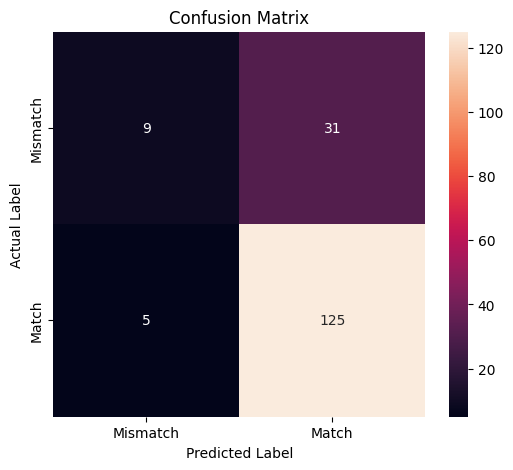

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

cm = confusion_matrix(y_test, y_pred)

plt.figure(figsize=(6, 5))
sns.heatmap(
    cm,
    annot=True,
    fmt="d",
    xticklabels=["Mismatch", "Match"],
    yticklabels=["Mismatch", "Match"]
)

plt.xlabel("Predicted Label")
plt.ylabel("Actual Label")
plt.title("Confusion Matrix")
plt.show()

In [ ]:
feature_importance = pd.DataFrame({
    "Feature": features,
    "Coefficient": model.coef_[0]
})

feature_importance["Absolute_Importance"] = (
    feature_importance["Coefficient"].abs()
)

feature_importance = feature_importance.sort_values(
    "Absolute_Importance",
    ascending=False
)

print(feature_importance)

              Feature  Coefficient  Absolute_Importance
6  requirements_ratio     0.672697             0.672697
0         macro_score     0.619221             0.619221
1         micro_score    -0.536592             0.536592
3    aggregated_micro     0.335144             0.335144
4    requirements_met    -0.153965             0.153965
5  total_requirements     0.077289             0.077289
2    aggregated_macro    -0.009608             0.009608


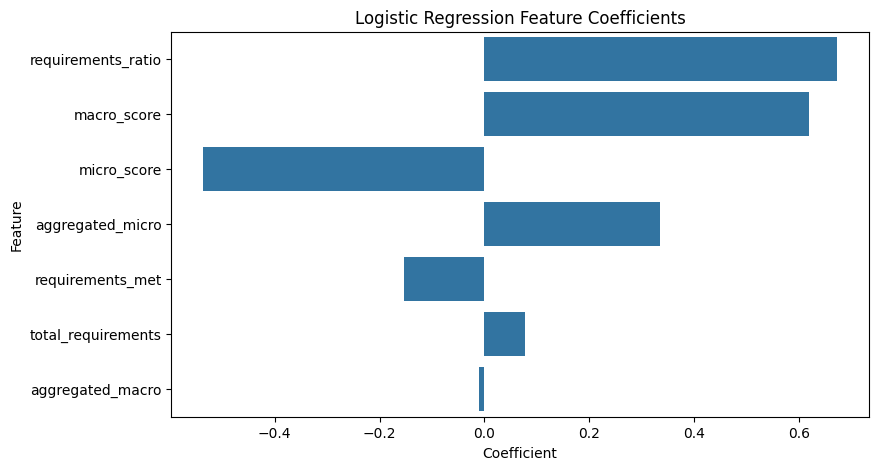

In [ ]:
plt.figure(figsize=(9, 5))

sns.barplot(
    data=feature_importance,
    x="Coefficient",
    y="Feature"
)

plt.title("Logistic Regression Feature Coefficients")
plt.xlabel("Coefficient")
plt.ylabel("Feature")
plt.show()

In [ ]:
text_records = []

for file in files:
    filename = os.path.basename(file)

    if not (
        filename.startswith("match_")
        or filename.startswith("mismatch_")
    ):
        continue

    try:
        with open(file, "r", encoding="utf-8") as f:
            data = json.load(f)

        input_data = data.get("input", {})

        job_description = input_data.get("job_description", "")
        additional_info = input_data.get("additional_info", "")

        text = job_description + " " + additional_info

        text_records.append({
            "file": filename,
            "text": text,
            "label": 1 if filename.startswith("match_") else 0
        })

    except Exception as e:
        print("Error:", filename, "->", e)

print("Text records:", len(text_records))

Text records: 849


In [ ]:
text_df = pd.DataFrame(text_records)

print(text_df.shape)
print(text_df.head())

(849, 3)
               file                                               text  label
0      match_8.json  ## Lead Generation and Business Intelligence S...      1
1    match_135.json  Join **TechVentures Inc.** as a **Senior Proje...      1
2  mismatch_21.json  **Business Development Manager**  \nJoin [Fict...      0
3    match_587.json  ### Key Account Manager at LuxoTech Solutions\...      1
4     match_10.json  ### Business Development Executive\n\n**Compan...      1


In [ ]:
vectorizer = TfidfVectorizer(
    max_features=5000,
    stop_words="english"
)

X_text = vectorizer.fit_transform(text_df["text"])

y_text = text_df["label"]

print("TF-IDF shape:", X_text.shape)

TF-IDF shape: (849, 926)


In [ ]:
X_text_train, X_text_test, y_text_train, y_text_test = train_test_split(
    X_text,
    y_text,
    test_size=0.2,
    random_state=42,
    stratify=y_text
)

print("Training samples:", X_text_train.shape[0])
print("Testing samples:", X_text_test.shape[0])
print("Training features:", X_text_train.shape[1])

Training samples: 679
Testing samples: 170
Training features: 926


In [ ]:
text_model = LogisticRegression(
    max_iter=1000
)

text_model.fit(
    X_text_train,
    y_text_train
)

print("TF-IDF model trained successfully")

TF-IDF model trained successfully


In [ ]:
y_text_pred = text_model.predict(X_text_test)

print("Predictions generated successfully")
print(y_text_pred[:20])

Predictions generated successfully
[1 1 1 1 1 0 0 1 1 0 1 1 1 0 1 1 0 1 1 1]


In [ ]:
text_accuracy = accuracy_score(y_text_test, y_text_pred)
text_precision = precision_score(y_text_test, y_text_pred)
text_recall = recall_score(y_text_test, y_text_pred)
text_f1 = f1_score(y_text_test, y_text_pred)

print("TF-IDF Model Evaluation")
print("-" * 30)
print("Accuracy :", round(text_accuracy, 4))
print("Precision:", round(text_precision, 4))
print("Recall   :", round(text_recall, 4))
print("F1 Score :", round(text_f1, 4))

TF-IDF Model Evaluation
------------------------------
Accuracy : 0.9941
Precision: 0.9924
Recall   : 1.0
F1 Score : 0.9962


In [ ]:
print(classification_report(
    y_text_test,
    y_text_pred,
    target_names=["Mismatch", "Match"]
))

              precision    recall  f1-score   support

    Mismatch       1.00      0.97      0.99        40
       Match       0.99      1.00      1.00       130

    accuracy                           0.99       170
   macro avg       1.00      0.99      0.99       170
weighted avg       0.99      0.99      0.99       170



In [ ]:
comparison = pd.DataFrame({
    "Model": [
        "Score-Based Logistic Regression",
        "TF-IDF Logistic Regression"
    ],
    "Accuracy": [
        accuracy,
        text_accuracy
    ],
    "Precision": [
        precision,
        text_precision
    ],
    "Recall": [
        recall,
        text_recall
    ],
    "F1 Score": [
        f1,
        text_f1
    ]
})

print(comparison.round(4))

                             Model  Accuracy  Precision  Recall  F1 Score
0  Score-Based Logistic Regression    0.7882     0.8013  0.9615    0.8741
1       TF-IDF Logistic Regression    0.9941     0.9924  1.0000    0.9962


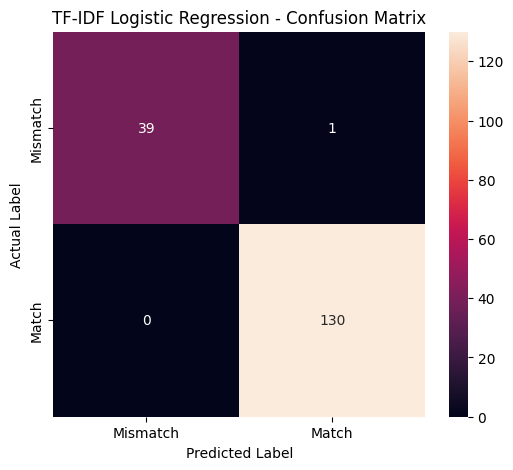

In [ ]:
text_cm = confusion_matrix(y_text_test, y_text_pred)

plt.figure(figsize=(6, 5))

sns.heatmap(
    text_cm,
    annot=True,
    fmt="d",
    xticklabels=["Mismatch", "Match"],
    yticklabels=["Mismatch", "Match"]
)

plt.xlabel("Predicted Label")
plt.ylabel("Actual Label")
plt.title("TF-IDF Logistic Regression - Confusion Matrix")
plt.show()

In [ ]:
duplicate_count = text_df["text"].duplicated().sum()

print("Duplicate text records:", duplicate_count)

Duplicate text records: 831


In [ ]:
print("Total records:", len(text_df))
print("Unique text records:", text_df["text"].nunique())
print("Duplicate records:", text_df["text"].duplicated().sum())

Total records: 849
Unique text records: 18
Duplicate records: 831


In [ ]:
unique_texts = (
    text_df.groupby("text")["label"]
    .agg(["count", "nunique", "sum"])
    .sort_values("count", ascending=False)
)

print(unique_texts)

                                                    count  nunique  sum
text                                                                   
### Business Development Executive\n\n**Company...     79        1   79
### Business Development Manager\n\nJoin **Inno...     78        1   78
Join **TechVentures Inc.** as a **Senior Projec...     76        1   76
**Title: Business Development Manager**  \n\n**...     76        1   76
**Business Development Manager**  \nJoin [Ficti...     75        1    0
## Lead Generation and Business Intelligence Sp...     73        1   73
### Key Account Manager at LuxoTech Solutions\n...     73        1   73
### Business Development Manager\n\n**Fictional...     72        1   72
### Join Apex Global Solutions as a Business De...     66        1    0
## Job Title: Sales and SEO Management Speciali...     66        1   66
### Digital Marketing Strategist at InnovateTec...     50        1    0
## Join Our Dynamic Team as a Senior Sales and ...     45       

In [ ]:
unique_text_df = text_df.drop_duplicates(subset="text").reset_index(drop=True)

print("Original records:", len(text_df))
print("Unique records:", len(unique_text_df))
print("\nLabel distribution:")
print(unique_text_df["label"].value_counts())

Original records: 849
Unique records: 18

Label distribution:
label
1    12
0     6
Name: count, dtype: int64


In [ ]:
from sklearn.model_selection import StratifiedKFold, cross_validate

X_unique = unique_text_df["text"]
y_unique = unique_text_df["label"]

skf = StratifiedKFold(
    n_splits=6,
    shuffle=True,
    random_state=42
)

print("Total unique samples:", len(unique_text_df))
print("Cross-validation folds:", skf.get_n_splits())
print("Class distribution:")
print(y_unique.value_counts())

Total unique samples: 18
Cross-validation folds: 6
Class distribution:
label
1    12
0     6
Name: count, dtype: int64


In [ ]:
from sklearn.pipeline import Pipeline
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

tfidf_pipeline = Pipeline([
    ("tfidf", TfidfVectorizer(
        max_features=5000,
        stop_words="english"
    )),
    ("classifier", LogisticRegression(max_iter=1000))
])

cv_results = cross_validate(
    tfidf_pipeline,
    X_unique,
    y_unique,
    cv=skf,
    scoring=["accuracy", "precision", "recall", "f1"],
    return_train_score=True
)

print("Mean CV Accuracy:", round(cv_results["test_accuracy"].mean(), 4))
print("Mean CV Precision:", round(cv_results["test_precision"].mean(), 4))
print("Mean CV Recall:", round(cv_results["test_recall"].mean(), 4))
print("Mean CV F1:", round(cv_results["test_f1"].mean(), 4))

Mean CV Accuracy: 0.6667
Mean CV Precision: 0.6667
Mean CV Recall: 1.0
Mean CV F1: 0.8


In [ ]:
from sklearn.model_selection import cross_val_predict
from sklearn.metrics import confusion_matrix

y_cv_pred = cross_val_predict(
    tfidf_pipeline,
    X_unique,
    y_unique,
    cv=skf
)

cm = confusion_matrix(y_unique, y_cv_pred)

print("Confusion Matrix:")
print(cm)

Confusion Matrix:
[[ 0  6]
 [ 0 12]]


In [ ]:
for i, row in unique_text_df.iterrows():
    print(f"\n--- Record {i+1} | Label: {row['label']} ---")
    print(row["text"][:500])


--- Record 1 | Label: 1 ---
## Lead Generation and Business Intelligence Specialist

Join **Innovate Connections Inc.** as a Lead Generation and Business Intelligence Specialist. You will play a pivotal role in driving business growth by spearheading lead generation initiatives and providing strategic insights through data analytics. We are looking for a highly skilled professional with a strong background in lead generation, data management, and business intelligence.

### Key Responsibilities:
- Develop and execute lead 

--- Record 2 | Label: 1 ---
Join **TechVentures Inc.** as a **Senior Project Manager** where you'll oversee the delivery of key data management and analytics projects. We are looking for an innovative leader who can set and uphold delivery standards, while managing cross-functional teams to achieve the highest levels of service excellence. Your expertise in pre-sales, solution architecture, and client relationship management will drive our expansion into new market

In [ ]:
print("Input fields:")
for key in match_sample["input"].keys():
    print("-", key)


Input fields:
- job_description
- macro_dict
- micro_dict
- additional_info
- minimum_requirements
- resume


In [ ]:
print("Resume type:", type(match_sample["input"]["resume"]))
print("\nResume sample:")
print(str(match_sample["input"]["resume"])[:1500])

Resume type: <class 'str'>

Resume sample:
SHAHRUKH ALI
shahrukh.ali@descon.com 4618452
linkedin.com/in/shahrukh-ali-3021ab24a
Summary
A highly motivated and result-driven Business Development Executive who also has served as a Finance &
Accounts Professional with 12 years of invaluable experience including being skilled in numerous business
development, financial & accounting fields. I have the ability to handle complex assignments effectively &
possessing the confidence to work as part of a team or independently. An established reputation for self‐
motivation, attention to detail excellent organizational skills, and high ethical conduct. Presently looking for the
best opportunity with a goal-oriented company where I can excel, deliver and achieve according to my potential. I
am enthusiastic to learn keenly about emerging developments in my job sector.
Experience
Senior Associate
KPMG In Pakistan
Aug 2021 - Feb 2022 (7 months)
Team Supervision and Training
Data entry analyst: Update t

In [ ]:
match_records = []

for file in files:
    filename = os.path.basename(file)

    if filename.startswith("match_") or filename.startswith("mismatch_"):
        try:
            with open(file, "r", encoding="utf-8") as f:
                data = json.load(f)

            job_description = data["input"]["job_description"]
            resume = data["input"]["resume"]

            label = 1 if filename.startswith("match_") else 0

            match_records.append({
                "resume": resume,
                "job_description": job_description,
                "text": resume + "\n\n" + job_description,
                "label": label
            })

        except Exception as e:
            print("Error:", filename, e)

resume_df = pd.DataFrame(match_records)

print("Total records:", len(resume_df))
print("Columns:", resume_df.columns.tolist())
print("\nLabel distribution:")
print(resume_df["label"].value_counts())

Total records: 849
Columns: ['resume', 'job_description', 'text', 'label']

Label distribution:
label
1    648
0    201
Name: count, dtype: int64


In [ ]:
duplicate_pairs = resume_df.duplicated(
    subset=["resume", "job_description"]
).sum()

unique_pairs = resume_df.drop_duplicates(
    subset=["resume", "job_description"]
)

print("Total records:", len(resume_df))
print("Duplicate Resume-JD pairs:", duplicate_pairs)
print("Unique Resume-JD pairs:", len(unique_pairs))
print("\nLabel distribution after removing exact duplicates:")
print(unique_pairs["label"].value_counts())

Total records: 849
Duplicate Resume-JD pairs: 198
Unique Resume-JD pairs: 651

Label distribution after removing exact duplicates:
label
1    474
0    177
Name: count, dtype: int64


In [ ]:
resume_duplicates = unique_pairs["resume"].duplicated().sum()
jd_duplicates = unique_pairs["job_description"].duplicated().sum()

print("Duplicate resumes:", resume_duplicates)
print("Duplicate job descriptions:", jd_duplicates)

Duplicate resumes: 442
Duplicate job descriptions: 633


In [ ]:
print("Unique resumes:", unique_pairs["resume"].nunique())
print("Unique job descriptions:", unique_pairs["job_description"].nunique())

Unique resumes: 209
Unique job descriptions: 18


In [ ]:
model_df = unique_pairs.reset_index(drop=True).copy()

print("Final unique pairs:", len(model_df))
print("\nLabels:")
print(model_df["label"].value_counts())

print("\nUnique resumes:", model_df["resume"].nunique())
print("Unique job descriptions:", model_df["job_description"].nunique())

Final unique pairs: 651

Labels:
label
1    474
0    177
Name: count, dtype: int64

Unique resumes: 209
Unique job descriptions: 18


In [ ]:
from sklearn.model_selection import GroupShuffleSplit

groups = model_df["resume"]

gss = GroupShuffleSplit(
    n_splits=1,
    test_size=0.2,
    random_state=42
)

train_idx, test_idx = next(
    gss.split(
        model_df["text"],
        model_df["label"],
        groups=groups
    )
)

train_df = model_df.iloc[train_idx].reset_index(drop=True)
test_df = model_df.iloc[test_idx].reset_index(drop=True)

print("Training records:", len(train_df))
print("Testing records:", len(test_df))

print("\nTraining labels:")
print(train_df["label"].value_counts())

print("\nTesting labels:")
print(test_df["label"].value_counts())

print("\nShared resumes:", len(
    set(train_df["resume"]) & set(test_df["resume"])
))

Training records: 541
Testing records: 110

Training labels:
label
1    403
0    138
Name: count, dtype: int64

Testing labels:
label
1    71
0    39
Name: count, dtype: int64

Shared resumes: 0


In [ ]:
vectorizer = TfidfVectorizer(
    max_features=5000,
    stop_words="english"
)

X_train_text = vectorizer.fit_transform(train_df["text"])
X_test_text = vectorizer.transform(test_df["text"])

y_train = train_df["label"]
y_test = test_df["label"]

print("Training TF-IDF shape:", X_train_text.shape)
print("Testing TF-IDF shape:", X_test_text.shape)

Training TF-IDF shape: (541, 5000)
Testing TF-IDF shape: (110, 5000)


In [ ]:
from sklearn.linear_model import LogisticRegression

model = LogisticRegression(
    max_iter=1000,
    random_state=42
)

model.fit(X_train_text, y_train)

y_pred = model.predict(X_test_text)

print("Model training completed.")
print("Predictions generated:", len(y_pred))

Model training completed.
Predictions generated: 110


In [ ]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, classification_report, confusion_matrix

accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)

print("Accuracy:", round(accuracy, 4))
print("Precision:", round(precision, 4))
print("Recall:", round(recall, 4))
print("F1 Score:", round(f1, 4))

print("\nClassification Report:")
print(classification_report(y_test, y_pred, target_names=["Mismatch", "Match"]))

print("\nConfusion Matrix:")
print(confusion_matrix(y_test, y_pred))

Accuracy: 0.9091
Precision: 0.8765
Recall: 1.0
F1 Score: 0.9342

Classification Report:
              precision    recall  f1-score   support

    Mismatch       1.00      0.74      0.85        39
       Match       0.88      1.00      0.93        71

    accuracy                           0.91       110
   macro avg       0.94      0.87      0.89       110
weighted avg       0.92      0.91      0.91       110


Confusion Matrix:
[[29 10]
 [ 0 71]]


In [ ]:
cm = confusion_matrix(y_test, y_pred)

print("True Negatives (Mismatch correctly predicted):", cm[0, 0])
print("False Positives (Mismatch predicted as Match):", cm[0, 1])
print("False Negatives (Match predicted as Mismatch):", cm[1, 0])
print("True Positives (Match correctly predicted):", cm[1, 1])

True Negatives (Mismatch correctly predicted): 29
False Positives (Mismatch predicted as Match): 10
False Negatives (Match predicted as Mismatch): 0
True Positives (Match correctly predicted): 71


In [ ]:
from sklearn.model_selection import cross_val_score, StratifiedKFold

cv = StratifiedKFold(
    n_splits=5,
    shuffle=True,
    random_state=42
)

cv_scores = cross_val_score(
    model,
    X_train_text,
    y_train,
    cv=cv,
    scoring="f1"
)

print("5-Fold Cross-Validation F1 Scores:")
print(cv_scores)

print("\nMean CV F1:", round(cv_scores.mean(), 4))
print("Std CV F1:", round(cv_scores.std(), 4))

5-Fold Cross-Validation F1 Scores:
[0.93103448 0.93641618 0.93641618 0.93023256 0.94674556]

Mean CV F1: 0.9362
Std CV F1: 0.0059


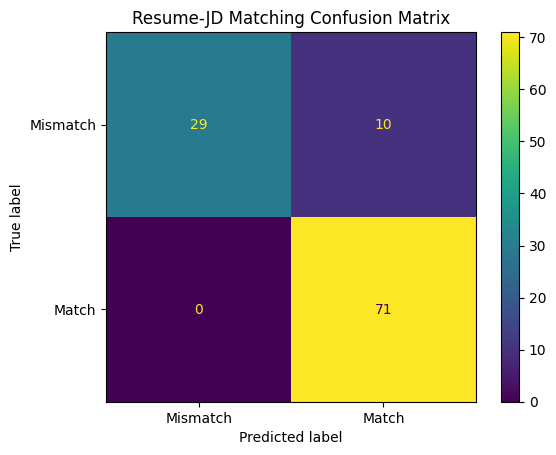

In [ ]:
from sklearn.metrics import ConfusionMatrixDisplay
import matplotlib.pyplot as plt

ConfusionMatrixDisplay.from_predictions(
    y_test,
    y_pred,
    display_labels=["Mismatch", "Match"]
)

plt.title("Resume-JD Matching Confusion Matrix")
plt.show()

In [ ]:
from sklearn.metrics import roc_auc_score, roc_curve

y_prob = model.predict_proba(X_test_text)[:, 1]

roc_auc = roc_auc_score(y_test, y_prob)

print("ROC-AUC Score:", round(roc_auc, 4))

ROC-AUC Score: 0.9967


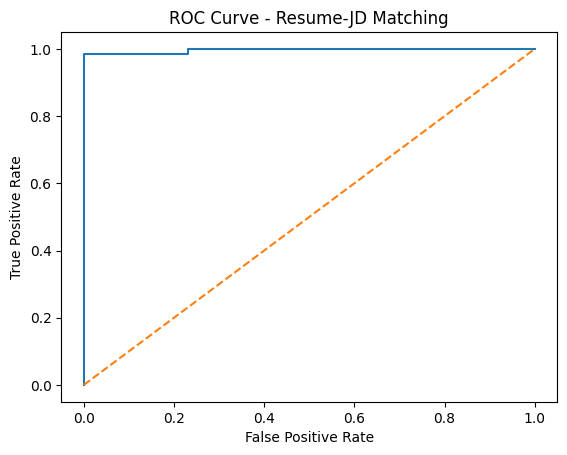

In [ ]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve

fpr, tpr, thresholds = roc_curve(y_test, y_prob)

plt.plot(fpr, tpr)
plt.plot([0, 1], [0, 1], linestyle="--")

plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve - Resume-JD Matching")
plt.show()

In [ ]:
print("===== FINAL MODEL RESULTS =====")
print("Accuracy :", round(accuracy, 4))
print("Precision:", round(precision, 4))
print("Recall   :", round(recall, 4))
print("F1 Score :", round(f1, 4))
print("ROC-AUC  :", round(roc_auc, 4))

print("\n===== DATASET SUMMARY =====")
print("Total unique Resume-JD pairs:", len(model_df))
print("Training pairs:", len(train_df))
print("Testing pairs:", len(test_df))
print("Match:", int(model_df["label"].sum()))
print("Mismatch:", int((model_df["label"] == 0).sum()))

===== FINAL MODEL RESULTS =====
Accuracy : 0.9091
Precision: 0.8765
Recall   : 1.0
F1 Score : 0.9342
ROC-AUC  : 0.9967

===== DATASET SUMMARY =====
Total unique Resume-JD pairs: 651
Training pairs: 541
Testing pairs: 110
Match: 474
Mismatch: 177


In [ ]:
comparison = pd.DataFrame({
    "Model": [
        "Score-Based Logistic Regression",
        "Resume + JD TF-IDF Logistic Regression"
    ],
    "Accuracy": [
        0.7882,
        accuracy
    ],
    "Precision": [
        0.8013,
        precision
    ],
    "Recall": [
        0.9615,
        recall
    ],
    "F1 Score": [
        0.8741,
        f1
    ]
})

print(comparison.to_string(index=False))

                                 Model  Accuracy  Precision  Recall  F1 Score
       Score-Based Logistic Regression  0.788200   0.801300  0.9615  0.874100
Resume + JD TF-IDF Logistic Regression  0.909091   0.876543  1.0000  0.934211


In [ ]:
sample_resume = test_df.iloc[0]["resume"]
sample_job_description = test_df.iloc[0]["job_description"]

sample_text = sample_resume + "\n\n" + sample_job_description

sample_vector = vectorizer.transform([sample_text])

prediction = model.predict(sample_vector)[0]
probability = model.predict_proba(sample_vector)[0][1]

print("Actual Label:", "Match" if test_df.iloc[0]["label"] == 1 else "Mismatch")
print("Predicted Label:", "Match" if prediction == 1 else "Mismatch")
print("Match Probability:", round(probability * 100, 2), "%")

Actual Label: Mismatch
Predicted Label: Mismatch
Match Probability: 35.74 %


In [ ]:
custom_resume = """
Software Engineer with experience in Python, React, JavaScript, machine learning,
REST APIs, Git, and frontend development.
"""

custom_job_description = """
We are looking for a Software Engineer with strong Python, machine learning,
React, REST API, and Git skills. Experience with AI projects is preferred.
"""

custom_text = custom_resume + "\n\n" + custom_job_description

custom_vector = vectorizer.transform([custom_text])

custom_prediction = model.predict(custom_vector)[0]
custom_probability = model.predict_proba(custom_vector)[0][1]

print("Prediction:", "MATCH" if custom_prediction == 1 else "MISMATCH")
print("Match Probability:", round(custom_probability * 100, 2), "%")

Prediction: MATCH
Match Probability: 50.94 %


In [ ]:
import joblib

joblib.dump(model, "resume_jd_model.pkl")
joblib.dump(vectorizer, "resume_jd_vectorizer.pkl")

print("Model saved: resume_jd_model.pkl")
print("Vectorizer saved: resume_jd_vectorizer.pkl")

Model saved: resume_jd_model.pkl
Vectorizer saved: resume_jd_vectorizer.pkl


In [ ]:
loaded_model = joblib.load("resume_jd_model.pkl")
loaded_vectorizer = joblib.load("resume_jd_vectorizer.pkl")

test_text = custom_resume + "\n\n" + custom_job_description

test_vector = loaded_vectorizer.transform([test_text])

loaded_prediction = loaded_model.predict(test_vector)[0]
loaded_probability = loaded_model.predict_proba(test_vector)[0][1]

print("Loaded Model Prediction:",
      "MATCH" if loaded_prediction == 1 else "MISMATCH")

print("Match Probability:",
      round(loaded_probability * 100, 2), "%")

Loaded Model Prediction: MATCH
Match Probability: 50.94 %


In [ ]:
if loaded_probability < 0.40:
    match_level = "Low Match"
elif loaded_probability < 0.60:
    match_level = "Borderline Match"
else:
    match_level = "Strong Match"

print("Prediction:", "MATCH" if loaded_prediction == 1 else "MISMATCH")
print("Match Probability:", round(loaded_probability * 100, 2), "%")
print("Match Level:", match_level)

Prediction: MATCH
Match Probability: 50.94 %
Match Level: Borderline Match


In [ ]:
print("===== FINAL PROJECT ANALYSIS =====")

print("\nDataset:")
print("Unique Resume-JD pairs:", len(model_df))
print("Unique Resumes:", model_df["resume"].nunique())
print("Unique Job Descriptions:", model_df["job_description"].nunique())

print("\nModel:")
print("Algorithm: Logistic Regression")
print("Features: TF-IDF")
print("Input: Resume + Job Description")

print("\nEvaluation:")
print("Accuracy:", round(accuracy, 4))
print("Precision:", round(precision, 4))
print("Recall:", round(recall, 4))
print("F1 Score:", round(f1, 4))
print("ROC-AUC:", round(roc_auc, 4))

print("\nImportant Limitation:")
print("The dataset contains only",
      model_df["job_description"].nunique(),
      "unique job descriptions.")
print("Therefore, performance may not represent generalization to completely unseen job descriptions.")

===== FINAL PROJECT ANALYSIS =====

Dataset:
Unique Resume-JD pairs: 651
Unique Resumes: 209
Unique Job Descriptions: 18

Model:
Algorithm: Logistic Regression
Features: TF-IDF
Input: Resume + Job Description

Evaluation:
Accuracy: 0.9091
Precision: 0.8765
Recall: 1.0
F1 Score: 0.9342
ROC-AUC: 0.9967

Important Limitation:
The dataset contains only 18 unique job descriptions.
Therefore, performance may not represent generalization to completely unseen job descriptions.


In [ ]:
def predict_resume_match(resume, job_description):
    text = resume + "\n\n" + job_description

    vector = loaded_vectorizer.transform([text])

    prediction = loaded_model.predict(vector)[0]
    probability = loaded_model.predict_proba(vector)[0][1]

    if probability < 0.40:
        match_level = "Low Match"
    elif probability < 0.60:
        match_level = "Borderline Match"
    else:
        match_level = "Strong Match"

    print("Prediction:", "MATCH" if prediction == 1 else "MISMATCH")
    print("Match Probability:", round(probability * 100, 2), "%")
    print("Match Level:", match_level)

    return prediction, probability

In [ ]:
from google.colab import files

files.download("resume_jd_model.pkl")
files.download("resume_jd_vectorizer.pkl")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>